# Trabajo Fin de Máster  
## Análisis de sentimientos en noticias financieras mediante Aprendizaje Automático y Procesamiento del Lenguaje Natural  


*   ### Autor: Pablo Bayón Gala
*   ### Universidad: Universidad Internacional de La Rioja
*   ### Máster: Máster Universitario en Inteligencia Artificial  
*   ### Fecha: Septiembre 2025


---


© 2025 Pablo Bayón Gala.

Este cuaderno contiene el código y los experimentos realizados para el desarrollo del Trabajo Fin de Máster, en el que se implementan y comparan distintos modelos de Procesamiento del Lenguaje Natural aplicados al análisis de sentimiento en textos financieros.

Se distribuye bajo la **GNU General Public License v3.0 (GPL v3)**.

Para más detalles sobre la licencia: [https://www.gnu.org/licenses/gpl-3.0.html](https://www.gnu.org/licenses/gpl-3.0.html)


# Preprocesamiento de los datos

El preprocesamiento de datos siguiente lo voy a estructurar en forma de pipeline diferenciando dos tipos:

1. Por un lado, los tres modelos basados en arquitectura Transformers (FinBERT, DistilRoBERTa con fine-tuning y BERTweet) ya incluyen un tokenizador preentrenado junto con el modelo. Dicho tokenizador espera el texto en bruto (con mayúsculas, tildes, hashtags, etc.) porque su preentrenamiento se realizó con texto real provenientes de noticias / tweets. Para estos modelos, se implementa una limpieza ligera para no alterar el lenguaje natural. Su flujo de limpieza consiste en los siguientes pasos:
  * Eliminación de duplicados
  *	Eliminación de tweets vacíos
  *	Eliminación de URLs

2. Por otro lado, el modelo basado en diccionarios y reglas (VADER) requiere un preprocesamiento más profundo. Su flujo de limpieza se basa en los siguientes pasos:
  *	Eliminación de duplicados
  *	Eliminación de tweets vacíos
  *	Eliminación de URLs
  *	Eliminación de menciones (@usuario)
  *	Eliminación de hashtags
  *	Eliminación de espacios adicionales

In [9]:
""" Pipeline de preprocesamiento para modelos basados en Transformers """
def limpieza_transformers(texto):

  # Eliminamos URLs
  texto = re.sub(r"(http[s]?://\S+)|(www\.\S+)", "", texto)

  return texto

""" Pipeline de preprocesamiento para VADER """
def limpieza_vader(texto):

  # Eliminamos menciones
  texto = re.sub('@[^\s]+','',texto)
  # Eliminamos hashtags (manteniendo la palabra del hashtag)
  texto = re.sub(r'#','',texto)
  # Eliminamos URLs
  texto = re.sub(r"(http[s]?://\S+)|(www\.\S+)", "", texto)
  # Reemplazamos múltiples espacios seguidos por un solo espacio
  texto = re.sub(r'\s+', ' ', texto, flags=re.I)

  return texto

# Evaluación de mis modelos PLN a partir de los conjuntos de datos etiquetados

## Dataset sobre titulares de noticias financieras
**Labeled Stock News Headlines**

URL: https://www.kaggle.com/datasets/johoetter/labeled-stock-news-headlines

In [1]:
import pandas as pd

# Cargo el dataset
df_Stock_News_Headlines = pd.read_csv('stock_news.csv')

df_Stock_News_Headlines.head()

,Unnamed: 0,headline,label
0,0,"Markets Close Mostly Lower Again; ROST, PANW R...",Negative
1,1,"Gap plummets on earnings miss, cuts full-year ...",Negative
2,2,Billionaire Ken Fisher is Selling These 10 Stocks,Negative
3,3,"Corning net income drops 13%, shares fall",Negative
4,4,Internet Explorer shutdown to cause Japan prob...,Negative


In [2]:
df_Stock_News_Headlines.shape

(26000, 3)

In [ ]:
df_Stock_News_Headlines.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26000 entries, 0 to 25999
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  26000 non-null  int64 
 1   headline    26000 non-null  object
 2   label       26000 non-null  object
dtypes: int64(1), object(2)
memory usage: 609.5+ KB


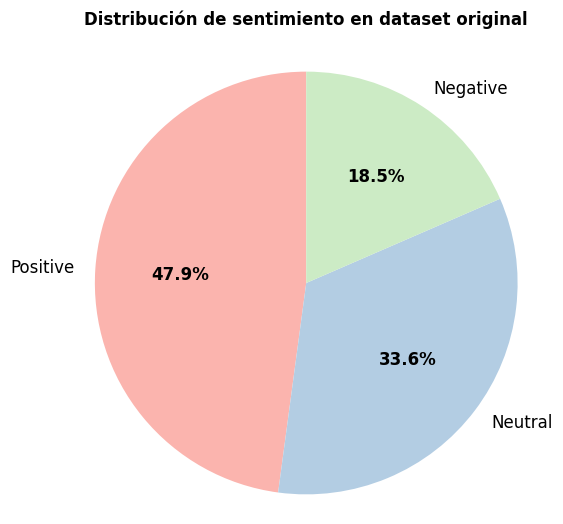

In [ ]:
import matplotlib.pyplot as plt

# Datos
counts = df_Stock_News_Headlines['label'].value_counts()
labels = counts.index

# Paleta de colores agradable (pastel o profesional)
colors = plt.cm.Pastel1(range(len(labels)))

# Gráfico
fig, ax = plt.subplots(figsize=(6, 6))
wedges, texts, autotexts = ax.pie(
    counts,
    labels=labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    textprops={'fontsize': 12, 'color': 'black'}
)

# Mejorar visibilidad de porcentajes
for autotext in autotexts:
    autotext.set_color('black')
    autotext.set_fontweight('bold')

# Título con formato profesional
ax.set_title(
    "Distribución de sentimiento en dataset original",
    fontsize=12,
    fontweight='bold',
    pad=20
)

# Mantener el pastel como círculo perfecto
ax.axis('equal')

# Quitar el borde de las etiquetas para un look limpio
plt.setp(texts, fontweight='medium')

plt.show()

In [3]:
# BALANCEAMOS EL DATASET
# Comprobamos distribución inicial
print("Distribución original:")
print(df_Stock_News_Headlines['label'].value_counts(normalize=True) * 100)

# Determinamos tamaño de la clase minoritaria (Negative)
min_class = "Negative"
min_count = df_Stock_News_Headlines[df_Stock_News_Headlines['label'] == min_class].shape[0]
print(f"\nTamaño de la clase minoritaria ({min_class}): {min_count}")

# Tomamos todos los textos de la clase minoritaria
df_min = df_Stock_News_Headlines[df_Stock_News_Headlines['label'] == min_class]

# Submuestreamos aleatoriamente las otras clases para igualar tamaño
balanced_parts = [df_min]  # empezamos con la clase minoritaria

for label in ["Positive", "Neutral"]:
    df_label = df_Stock_News_Headlines[df_Stock_News_Headlines['label'] == label].sample(
        n=min_count,
        random_state=42
    )
    balanced_parts.append(df_label)

# Combinamos en un dataset balanceado
df_Stock_News_Headlines_balanceado = pd.concat(balanced_parts).sample(frac=1, random_state=42).reset_index(drop=True)

# Comprobamos distribución final
print("\nDistribución balanceada:")
print(df_Stock_News_Headlines_balanceado['label'].value_counts())

# Guardamos el dataset balanceado
df_Stock_News_Headlines_balanceado.to_excel("stock_news_balanced.xlsx", index=False)

print("\nDataset balanceado guardado correctamente.")

Distribución original:
label
Positive    47.876923
Neutral     33.646154
Negative    18.476923
Name: proportion, dtype: float64

Tamaño de la clase minoritaria (Negative): 4804

Distribución balanceada:
label
Positive    4804
Negative    4804
Neutral     4804
Name: count, dtype: int64

Dataset balanceado guardado correctamente.


In [4]:
df_Stock_News_Headlines_balanceado.shape

(14412, 3)

### 1. Modelo FinBERT

In [ ]:
!pip install transformers

In [ ]:
import pandas as pd
from transformers import AutoTokenizer, AutoModelForSequenceClassification, TextClassificationPipeline

# Cargar FinBERT desde Hugging Face
model_name = "ProsusAI/finbert"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

# Crear el pipeline de FinBERT
finbert = TextClassificationPipeline(model=model, tokenizer=tokenizer, return_all_scores=False, truncation=True)

# Aplicar FinBERT a cada titular
df_Stock_News_Headlines_balanceado['FinBERT_sentiment'] = df_Stock_News_Headlines_balanceado['headline'].apply(lambda x: finbert(x)[0]['label'])
df_Stock_News_Headlines_balanceado['confidence'] = df_Stock_News_Headlines_balanceado['headline'].apply(lambda x: finbert(x)[0]['score'])

# Mostrar resultados
print(df_Stock_News_Headlines_balanceado)
df_Stock_News_Headlines_balanceado.to_excel("LSNH_balanceado_FinBERT.xlsx", index=False)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/758 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

Device set to use cuda:0


model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/transformers/pipelines/text_classification.py:111: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(
You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


       Unnamed: 0                                           headline  \
0           16706               What's Working in 2022? Value Stocks   
1           25586  NiSource Inc. (NYSE:NI) Shares Could Be 26% Ab...   
2           17952  Brookfield to Partner With Elliott for Nielsen...   
3            3813  Zombie Firms Face Slow Death in US as Era of E...   
4           14072  Colorado utility gets OK for historic $1.7 bil...   
...           ...                                                ...   
14407       21290  Medtronic (MDT) Reports Positive Findings Back...   
14408       12169  Roe overturned, Theranos trial, EPA rights: 3 ...   
14409       20627  Wintrust Financial (WTFC) Q4 Earnings and Reve...   
14410         860  Prologis (PLD) Stock Sinks As Market Gains: Wh...   
14411       23884  Report: One of Triangle's largest employers st...   

          label FinBERT_sentiment  confidence  
0      Positive           neutral    0.940197  
1      Positive          negative    0.

In [ ]:
# 1. Vemos la arquitectura de alto nivel del modelo
print(model)

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [ ]:
# 2. Accedemos a la configuración del modelo
print(model.config)

BertConfig {
  "architectures": [
    "BertForSequenceClassification"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "dtype": "float32",
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "id2label": {
    "0": "positive",
    "1": "negative",
    "2": "neutral"
  },
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "label2id": {
    "negative": 1,
    "neutral": 2,
    "positive": 0
  },
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.57.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}



In [ ]:
df_Stock_News_Headlines_balanceado.head()

,Unnamed: 0,headline,label,FinBERT_sentiment,confidence
0,16706,What's Working in 2022? Value Stocks,positive,neutral,0.940197
1,25586,NiSource Inc. (NYSE:NI) Shares Could Be 26% Ab...,positive,negative,0.847578
2,17952,Brookfield to Partner With Elliott for Nielsen...,positive,neutral,0.774298
3,3813,Zombie Firms Face Slow Death in US as Era of E...,negative,negative,0.856586
4,14072,Colorado utility gets OK for historic $1.7 bil...,positive,positive,0.903063


Matriz de confusión:
               Pred_Positive  Pred_Negative  Pred_Neutral
True_Positive           1686            315          2803
True_Negative            265           2929          1610
True_Neutral             574            310          3920

Reporte de clasificación:
              precision    recall  f1-score   support

    negative      0.824     0.610     0.701      4804
     neutral      0.470     0.816     0.597      4804
    positive      0.668     0.351     0.460      4804

    accuracy                          0.592     14412
   macro avg      0.654     0.592     0.586     14412
weighted avg      0.654     0.592     0.586     14412



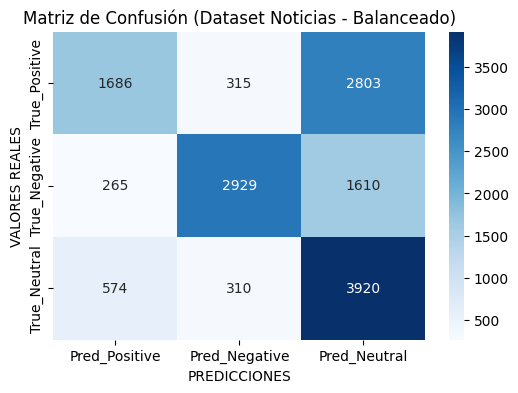

In [ ]:
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurarse de que las etiquetas estén en el mismo formato (ej. capitalización)
df_Stock_News_Headlines_balanceado["label"] = df_Stock_News_Headlines_balanceado["label"].str.lower().str.strip()
df_Stock_News_Headlines_balanceado["FinBERT_sentiment"] = df_Stock_News_Headlines_balanceado["FinBERT_sentiment"].str.lower().str.strip()

# Calcular matriz de confusión
cm = confusion_matrix(df_Stock_News_Headlines_balanceado["label"], df_Stock_News_Headlines_balanceado["FinBERT_sentiment"], labels=["positive", "negative", "neutral"])

# Mostrar como DataFrame
cm_df_Stock_News_Headlines_balanceado = pd.DataFrame(cm, index=["True_Positive", "True_Negative", "True_Neutral"],
                        columns=["Pred_Positive", "Pred_Negative", "Pred_Neutral"])

print("Matriz de confusión:")
print(cm_df_Stock_News_Headlines_balanceado)

# Reporte de métricas
print("\nReporte de clasificación:")
print(classification_report(df_Stock_News_Headlines_balanceado["label"], df_Stock_News_Headlines_balanceado["FinBERT_sentiment"], digits=3))

# Visualización con heatmap
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Pred_Positive", "Pred_Negative", "Pred_Neutral"],
            yticklabels=["True_Positive", "True_Negative", "True_Neutral"])
plt.xlabel("PREDICCIONES")
plt.ylabel("VALORES REALES")
plt.title("Matriz de Confusión (Dataset Noticias - Balanceado)")
plt.show()

### 2. Modelo DistilRoBERTa + Fine-tuning

In [ ]:
import pandas as pd
from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification

# Cargar el modelo desde Hugging Face
model_name = "mrm8488/distilroberta-finetuned-financial-news-sentiment-analysis"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

# Creamos el pipeline con el modelo
sentiment_model = pipeline(
    "sentiment-analysis",
    model="mrm8488/distilroberta-finetuned-financial-news-sentiment-analysis"
)

# Función para analizar sentimiento
def analyze_sentiment(text):
    result = sentiment_model(text)[0]
    return pd.Series([result['label'], result['score']])

# Aplicar análisis a los titulares
df_Stock_News_Headlines_balanceado[['DistilRoBERTa_sentiment', 'confidence']] = df_Stock_News_Headlines_balanceado['headline'].apply(analyze_sentiment)

print(df_Stock_News_Headlines_balanceado)
df_Stock_News_Headlines_balanceado.to_excel("LSNH_balanceado_DistilRoBERTa.xlsx", index=False)

tokenizer_config.json:   0%|          | 0.00/333 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/933 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/328M [00:00<?, ?B/s]

Device set to use cuda:0


       Unnamed: 0                                           headline  \
0           16706               What's Working in 2022? Value Stocks   
1           25586  NiSource Inc. (NYSE:NI) Shares Could Be 26% Ab...   
2           17952  Brookfield to Partner With Elliott for Nielsen...   
3            3813  Zombie Firms Face Slow Death in US as Era of E...   
4           14072  Colorado utility gets OK for historic $1.7 bil...   
...           ...                                                ...   
14407       21290  Medtronic (MDT) Reports Positive Findings Back...   
14408       12169  Roe overturned, Theranos trial, EPA rights: 3 ...   
14409       20627  Wintrust Financial (WTFC) Q4 Earnings and Reve...   
14410         860  Prologis (PLD) Stock Sinks As Market Gains: Wh...   
14411       23884  Report: One of Triangle's largest employers st...   

          label FinBERT_sentiment  confidence DistilRoBERTa_sentiment  
0      positive           neutral    0.999877                 n

In [ ]:
# 1. Vemos la arquitectura de alto nivel del modelo
print(model)

RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(50265, 768, padding_idx=1)
      (position_embeddings): Embedding(514, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-5): 6 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
           

In [ ]:
# 2. Accedemos a la configuración del modelo
print(model.config)

RobertaConfig {
  "architectures": [
    "RobertaForSequenceClassification"
  ],
  "attention_probs_dropout_prob": 0.1,
  "bos_token_id": 0,
  "classifier_dropout": null,
  "dtype": "float32",
  "eos_token_id": 2,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "id2label": {
    "0": "negative",
    "1": "neutral",
    "2": "positive"
  },
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "label2id": {
    "negative": 0,
    "neutral": 1,
    "positive": 2
  },
  "layer_norm_eps": 1e-05,
  "max_position_embeddings": 514,
  "model_type": "roberta",
  "num_attention_heads": 12,
  "num_hidden_layers": 6,
  "pad_token_id": 1,
  "position_embedding_type": "absolute",
  "problem_type": "single_label_classification",
  "transformers_version": "4.57.1",
  "type_vocab_size": 1,
  "use_cache": true,
  "vocab_size": 50265
}



In [ ]:
df_Stock_News_Headlines_balanceado.head()

,Unnamed: 0,headline,label,FinBERT_sentiment,confidence,DistilRoBERTa_sentiment
0,16706,What's Working in 2022? Value Stocks,positive,neutral,0.999877,neutral
1,25586,NiSource Inc. (NYSE:NI) Shares Could Be 26% Ab...,positive,negative,0.998893,positive
2,17952,Brookfield to Partner With Elliott for Nielsen...,positive,neutral,0.999840,neutral
3,3813,Zombie Firms Face Slow Death in US as Era of E...,negative,negative,0.945027,negative
4,14072,Colorado utility gets OK for historic $1.7 bil...,positive,positive,0.999544,positive


Matriz de confusión:
               Pred_Positive  Pred_Negative  Pred_Neutral
True_Positive           1726            257          2821
True_Negative            617           2755          1432
True_Neutral             758            314          3732

Reporte de clasificación:
              precision    recall  f1-score   support

    negative      0.828     0.573     0.678      4804
     neutral      0.467     0.777     0.584      4804
    positive      0.557     0.359     0.437      4804

    accuracy                          0.570     14412
   macro avg      0.617     0.570     0.566     14412
weighted avg      0.617     0.570     0.566     14412



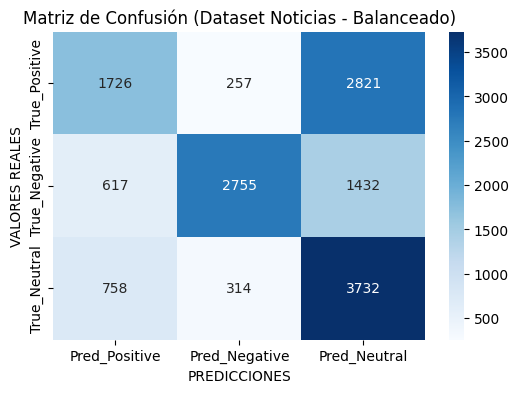

In [ ]:
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurarse de que las etiquetas estén en el mismo formato (ej. capitalización)
df_Stock_News_Headlines_balanceado["label"] = df_Stock_News_Headlines_balanceado["label"].str.lower().str.strip()
df_Stock_News_Headlines_balanceado["DistilRoBERTa_sentiment"] = df_Stock_News_Headlines_balanceado["DistilRoBERTa_sentiment"].str.lower().str.strip()

# Calcular matriz de confusión
cm = confusion_matrix(df_Stock_News_Headlines_balanceado["label"], df_Stock_News_Headlines_balanceado["DistilRoBERTa_sentiment"], labels=["positive", "negative", "neutral"])

# Mostrar como DataFrame
cm_df_Stock_News_Headlines_balanceado = pd.DataFrame(cm, index=["True_Positive", "True_Negative", "True_Neutral"],
                        columns=["Pred_Positive", "Pred_Negative", "Pred_Neutral"])

print("Matriz de confusión:")
print(cm_df_Stock_News_Headlines_balanceado)

# Reporte de métricas
print("\nReporte de clasificación:")
print(classification_report(df_Stock_News_Headlines_balanceado["label"], df_Stock_News_Headlines_balanceado["DistilRoBERTa_sentiment"], digits=3))

# Visualización con heatmap
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Pred_Positive", "Pred_Negative", "Pred_Neutral"],
            yticklabels=["True_Positive", "True_Negative", "True_Neutral"])
plt.xlabel("PREDICCIONES")
plt.ylabel("VALORES REALES")
plt.title("Matriz de Confusión (Dataset Noticias - Balanceado)")
plt.show()

### 3. Modelo BERTweet

In [ ]:
# Importar el modelo y tokenizer de BERTweet
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch
import torch.nn.functional as F
from tqdm import tqdm

# Modelo fine-tuned para análisis de sentimiento
MODEL_NAME = "finiteautomata/bertweet-base-sentiment-analysis" # Este modelo ya está afinado específicamente para clasificación de sentimiento en tweets
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME)

# Creamos una función para predecir sentimiento
def predict_sentiment(tweet: str) -> str:
    inputs = tokenizer(tweet, return_tensors="pt", truncation=True)
    with torch.no_grad():
        logits = model(**inputs).logits
        probs = F.softmax(logits, dim=1)
        label_id = torch.argmax(probs, dim=1).item()

    labels = model.config.id2label
    return labels[label_id]

# Lo aplico a mis tweets en formato original (sin preprocesado) porque el modelo de Hugging Face está entrenado para interpretar todo (emojis, menciones, etc.) como señales de sentimiento
tqdm.pandas() # Para mostrar una barra de progreso
# Convierto los valores a cadenas y reemplazo los NaN por texto vacío
df_Stock_News_Headlines_balanceado['headline'] = df_Stock_News_Headlines_balanceado['headline'].fillna('').astype(str)
# Creamos una nueva columna llamada bertweet_sentiment con etiquetas como NEG, NEU, POS llamando a la función anterior
df_Stock_News_Headlines_balanceado['BERTweet_sentiment'] = df_Stock_News_Headlines_balanceado['headline'].progress_apply(predict_sentiment)

# Guardamos los resultados
df_Stock_News_Headlines_balanceado.to_excel("LSNH_balanceado_BERTweet.xlsx", index=False)
df_Stock_News_Headlines_balanceado.head()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/338 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

bpe.codes: 0.00B [00:00, ?B/s]

added_tokens.json:   0%|          | 0.00/22.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/167 [00:00<?, ?B/s]

emoji is not installed, thus not converting emoticons or emojis into text. Install emoji: pip3 install emoji==0.6.0


config.json:   0%|          | 0.00/949 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/540M [00:00<?, ?B/s]

  0%|          | 13/14412 [00:01<25:59,  9.23it/s]

model.safetensors:   0%|          | 0.00/540M [00:00<?, ?B/s]

100%|██████████| 14412/14412 [25:59<00:00,  9.24it/s]


,Unnamed: 0,headline,label,BERTweet_sentiment
0,16706,What's Working in 2022? Value Stocks,Positive,NEU
1,25586,NiSource Inc. (NYSE:NI) Shares Could Be 26% Ab...,Positive,NEU
2,17952,Brookfield to Partner With Elliott for Nielsen...,Positive,NEU
3,3813,Zombie Firms Face Slow Death in US as Era of E...,Negative,NEG
4,14072,Colorado utility gets OK for historic $1.7 bil...,Positive,POS


In [ ]:
import pandas as pd

#df_Stock_News_Headlines_balanceado = pd.read_excel('LSNH_balanceado_BERTweet.xlsx')

In [ ]:
# 1. Vemos la arquitectura de alto nivel del modelo
print(model)

RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(64001, 768, padding_idx=1)
      (position_embeddings): Embedding(130, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
         

In [ ]:
# 2. Accedemos a la configuración del modelo
print(model.config)

RobertaConfig {
  "architectures": [
    "RobertaForSequenceClassification"
  ],
  "attention_probs_dropout_prob": 0.1,
  "bos_token_id": 0,
  "classifier_dropout": null,
  "dtype": "float32",
  "eos_token_id": 2,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "id2label": {
    "0": "NEG",
    "1": "NEU",
    "2": "POS"
  },
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "label2id": {
    "NEG": 0,
    "NEU": 1,
    "POS": 2
  },
  "layer_norm_eps": 1e-05,
  "max_position_embeddings": 130,
  "model_type": "roberta",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 1,
  "position_embedding_type": "absolute",
  "problem_type": "single_label_classification",
  "tokenizer_class": "BertweetTokenizer",
  "transformers_version": "4.57.1",
  "type_vocab_size": 1,
  "use_cache": true,
  "vocab_size": 64001
}



In [ ]:
# Tengo que mapear la etiqueta de sentimiento generada por mi modelo
def map_labels(label):
    if label == "POS":
        return "POSITIVE"
    elif label == "NEG":
        return "NEGATIVE"
    else:
        return "NEUTRAL"

df_Stock_News_Headlines_balanceado["BERTweet_sentiment_mapped"] = df_Stock_News_Headlines_balanceado["BERTweet_sentiment"].apply(map_labels)

df_Stock_News_Headlines_balanceado.head()

,Unnamed: 0,headline,label,BERTweet_sentiment,BERTweet_sentiment_mapped
0,16706,What's Working in 2022? Value Stocks,Positive,NEU,NEUTRAL
1,25586,NiSource Inc. (NYSE:NI) Shares Could Be 26% Ab...,Positive,NEU,NEUTRAL
2,17952,Brookfield to Partner With Elliott for Nielsen...,Positive,NEU,NEUTRAL
3,3813,Zombie Firms Face Slow Death in US as Era of E...,Negative,NEG,NEGATIVE
4,14072,Colorado utility gets OK for historic $1.7 bil...,Positive,POS,POSITIVE


Matriz de confusión:
               Pred_Positive  Pred_Negative  Pred_Neutral
True_Positive           1465            154          3185
True_Negative             84           2514          2206
True_Neutral             904            180          3720

Reporte de clasificación:
              precision    recall  f1-score   support

    negative      0.883     0.523     0.657      4804
     neutral      0.408     0.774     0.535      4804
    positive      0.597     0.305     0.404      4804

    accuracy                          0.534     14412
   macro avg      0.629     0.534     0.532     14412
weighted avg      0.629     0.534     0.532     14412



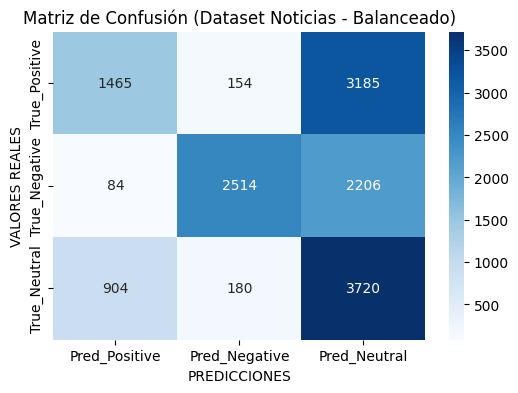

In [ ]:
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurarse de que las etiquetas estén en el mismo formato (ej. capitalización)
df_Stock_News_Headlines_balanceado["label"] = df_Stock_News_Headlines_balanceado["label"].str.lower().str.strip()
df_Stock_News_Headlines_balanceado["BERTweet_sentiment_mapped"] = df_Stock_News_Headlines_balanceado["BERTweet_sentiment_mapped"].str.lower().str.strip()

# Calcular matriz de confusión
cm = confusion_matrix(df_Stock_News_Headlines_balanceado["label"], df_Stock_News_Headlines_balanceado["BERTweet_sentiment_mapped"], labels=["positive", "negative", "neutral"])

# Mostrar como DataFrame
cm_df_Stock_News_Headlines_balanceado = pd.DataFrame(cm, index=["True_Positive", "True_Negative", "True_Neutral"],
                        columns=["Pred_Positive", "Pred_Negative", "Pred_Neutral"])

print("Matriz de confusión:")
print(cm_df_Stock_News_Headlines_balanceado)

# Reporte de métricas
print("\nReporte de clasificación:")
print(classification_report(df_Stock_News_Headlines_balanceado["label"], df_Stock_News_Headlines_balanceado["BERTweet_sentiment_mapped"], digits=3))

# Visualización con heatmap
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Pred_Positive", "Pred_Negative", "Pred_Neutral"],
            yticklabels=["True_Positive", "True_Negative", "True_Neutral"])
plt.xlabel("PREDICCIONES")
plt.ylabel("VALORES REALES")
plt.title("Matriz de Confusión (Dataset Noticias - Balanceado)")
plt.show()

### 4. Modelo VADER

In [6]:
# Instalo librerías necesarias
!pip install pyspellchecker
!pip install scattertext
!pip install nltk
!pip install -U kaleido

In [7]:
# Import Data Preprocessing and Wrangling libraries
import re
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
from datetime import datetime
import dateutil.parser

# Import NLP Libraries
import nltk
from spellchecker import SpellChecker
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA

# Import Visualization Libraries
import plotly.offline as pyo
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import seaborn as sns
import scattertext as st
from IPython.display import IFrame
from wordcloud import WordCloud, ImageColorGenerator
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import random

# Downloading periphrals
nltk.download('vader_lexicon')
nltk.download('stopwords')

import warnings
warnings.filterwarnings('ignore')

/usr/local/lib/python3.12/dist-packages/jieba/__init__.py:44: SyntaxWarning:

invalid escape sequence '\.'

/usr/local/lib/python3.12/dist-packages/jieba/__init__.py:46: SyntaxWarning:

invalid escape sequence '\s'

/usr/local/lib/python3.12/dist-packages/jieba/finalseg/__init__.py:78: SyntaxWarning:

invalid escape sequence '\.'

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [8]:
# Inicializo herramientas

# Para visualizaciones con seaborn
sns.set_style('darkgrid')

# Análisis de sentimiento con VADER
sia = SIA()

# Corrector ortográfico (puede ayudar antes del análisis de sentimiento)
spell = SpellChecker()

# Para mostrar gráficos Plotly en notebooks
pyo.init_notebook_mode()

In [10]:
""" Aplicamos pipeline de preprocesamiento para VADER (limpieza más profunda)"""

# Se crea una copia del DataFrame original df_tweets para no modificarlo directamente
data = df_Stock_News_Headlines_balanceado.copy()
# Se añade una columna original_tweet con el texto sin procesar a modo de backup para comparar
data['original_headline'] = df_Stock_News_Headlines_balanceado['headline']
# Reemplaza los valores nulos (NaN) en la columna "text" por cadenas vacías '' y convierte todo el contenido de la columna "text" a tipo string.
# Esto sirve para evitar que el modelo falle al encontrarse con un NaN y para garantizar que todo se maneje como string.
data['headline'] = data['headline'].fillna('').astype(str)

# Aplica la función de limpieza a la columna "text"
data['headline'] = data['headline'].apply(limpieza_vader)
# Eliminamos duplicados
data.drop_duplicates(subset=["headline"], inplace=True)
# Reseteamos el índice por si se ha eliminado alguna fila
data.reset_index(drop=True, inplace=True)

data.head()

,Unnamed: 0,headline,label,original_headline
0,16706,What's Working in 2022? Value Stocks,Positive,What's Working in 2022? Value Stocks
1,25586,NiSource Inc. (NYSE:NI) Shares Could Be 26% Ab...,Positive,NiSource Inc. (NYSE:NI) Shares Could Be 26% Ab...
2,17952,Brookfield to Partner With Elliott for Nielsen...,Positive,Brookfield to Partner With Elliott for Nielsen...
3,3813,Zombie Firms Face Slow Death in US as Era of E...,Negative,Zombie Firms Face Slow Death in US as Era of E...
4,14072,Colorado utility gets OK for historic $1.7 bil...,Positive,Colorado utility gets OK for historic $1.7 bil...


In [11]:
import textwrap

# Ancho máximo de cada línea (ejemplo: 80 caracteres)
width = 80

print("="*80)
print("headline ANTES de preprocesamiento:")
print("="*80)
print(textwrap.fill(data.original_headline[0], width=width))  # Aquí hace el salto de línea
print("\n" + "="*80)
#print(data.original_tweet[0])
print("headline DESPUÉS de preprocesamiento:")
print(80*"=")
print(textwrap.fill(data.headline[0], width=width))  # También aquí
#print(data.text[0])

headline ANTES de preprocesamiento:
What's Working in 2022? Value Stocks

headline DESPUÉS de preprocesamiento:
What's Working in 2022? Value Stocks


In [12]:
# Esta función convierte un valor de sentimiento (entre -1 y 1, generado por VADER) en una etiqueta categórica
def label_sentiment(x:float):
    if x < -0.05 : return 'negative'  # negative si es muy bajo
    if x > 0.05 : return 'positive'   # positive si es alto
    return 'neutral'                  # neutral si está entre ambos umbrales

# EXTRACCIÓN DE CARACTERÍSTICAS del texto
# Extrae todas las palabras de cada tweet usando regex, eliminando puntuación.
data['words'] = data.headline.apply(lambda x:re.findall(r'\w+', x ))
# Usa SpellChecker para detectar palabras mal escritas
data['errors'] = data.words.apply(spell.unknown)
# Cuenta cuántos errores ortográficos y cuántas palabras hay por tweet
data['errors_count'] = data.errors.apply(len)
data['words_count'] = data.words.apply(len)
# Longitud del tweet (en caracteres)
data['sentence_length'] = data.headline.apply(len)

# Análisis de sentimiento para cada tweet
# Aplica VADER (SentimentIntensityAnalyzer = SIA) a cada tweet para obtener el sentimiento compuesto (compound score), que va de -1 (negativo) a 1 (positivo).
data['compound'] = [sia.polarity_scores(x)['compound'] for x in tqdm(data['headline'])] # Se usa tqdm para mostrar una barra de progreso
# Clasifica el sentimiento numérico (compound) en positive, neutral o negative con la función definida al inicio.
data['VADER_sentiment'] = data['compound'].apply(label_sentiment);

data.head()

  0%|          | 0/14412 [00:00<?, ?it/s]

,Unnamed: 0,headline,label,original_headline,words,errors,errors_count,words_count,sentence_length,compound,VADER_sentiment
0,16706,What's Working in 2022? Value Stocks,Positive,What's Working in 2022? Value Stocks,"[What, s, Working, in, 2022, Value, Stocks]",{},0,7,36,0.3400,positive
1,25586,NiSource Inc. (NYSE:NI) Shares Could Be 26% Ab...,Positive,NiSource Inc. (NYSE:NI) Shares Could Be 26% Ab...,"[NiSource, Inc, NYSE, NI, Shares, Could, Be, 2...","{nyse, nisource}",2,13,80,0.5574,positive
2,17952,Brookfield to Partner With Elliott for Nielsen...,Positive,Brookfield to Partner With Elliott for Nielsen...,"[Brookfield, to, Partner, With, Elliott, for, ...",{brookfield},1,10,63,0.0000,neutral
3,3813,Zombie Firms Face Slow Death in US as Era of E...,Negative,Zombie Firms Face Slow Death in US as Era of E...,"[Zombie, Firms, Face, Slow, Death, in, US, as,...",{},0,13,61,0.1531,positive
4,14072,Colorado utility gets OK for historic $1.7 bil...,Positive,Colorado utility gets OK for historic $1.7 bil...,"[Colorado, utility, gets, OK, for, historic, 1...",{},0,12,71,0.4466,positive


In [ ]:
# Guardamos los resultados
data.to_excel("LSNH_balanceado_VADER.xlsx", index=False)

Matriz de confusión:
               Pred_Positive  Pred_Negative  Pred_Neutral
True_Positive           2014            340          2450
True_Negative           1065           1633          2106
True_Neutral            2067            399          2338

Reporte de clasificación:
              precision    recall  f1-score   support

    negative      0.688     0.340     0.455      4804
     neutral      0.339     0.487     0.400      4804
    positive      0.391     0.419     0.405      4804

    accuracy                          0.415     14412
   macro avg      0.473     0.415     0.420     14412
weighted avg      0.473     0.415     0.420     14412



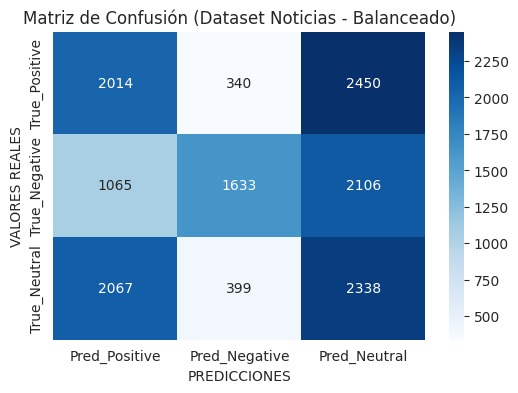

In [13]:
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurarse de que las etiquetas estén en el mismo formato (ej. capitalización)
data["label"] = data["label"].str.lower().str.strip()
data["VADER_sentiment"] = data["VADER_sentiment"].str.lower().str.strip()

# Calcular matriz de confusión
cm = confusion_matrix(data["label"], data["VADER_sentiment"], labels=["positive", "negative", "neutral"])

# Mostrar como DataFrame
cm_data = pd.DataFrame(cm, index=["True_Positive", "True_Negative", "True_Neutral"],
                        columns=["Pred_Positive", "Pred_Negative", "Pred_Neutral"])

print("Matriz de confusión:")
print(cm_data)

# Reporte de métricas
print("\nReporte de clasificación:")
print(classification_report(data["label"], data["VADER_sentiment"], digits=3))

# Visualización con heatmap
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Pred_Positive", "Pred_Negative", "Pred_Neutral"],
            yticklabels=["True_Positive", "True_Negative", "True_Neutral"])
plt.xlabel("PREDICCIONES")
plt.ylabel("VALORES REALES")
plt.title("Matriz de Confusión (Dataset Noticias - Balanceado)")
plt.show()

## Dataset sobre tweets de carácter financiero
**Financial Tweets Sentiment**

URL: https://huggingface.co/datasets/TimKoornstra/financial-tweets-sentiment

In [14]:
import pandas as pd

# Cargar el dataset
df_financial_tweets_sentiment = pd.read_parquet("train-00000-of-00001.parquet")

df_financial_tweets_sentiment.head()

,tweet,sentiment,url
0,$BYND - JPMorgan reels in expectations on Beyo...,2,https://huggingface.co/datasets/zeroshot/twitt...
1,$CCL $RCL - Nomura points to bookings weakness...,2,https://huggingface.co/datasets/zeroshot/twitt...
2,"$CX - Cemex cut at Credit Suisse, J.P. Morgan ...",2,https://huggingface.co/datasets/zeroshot/twitt...
3,$ESS: BTIG Research cuts to Neutral https://t....,2,https://huggingface.co/datasets/zeroshot/twitt...
4,$FNKO - Funko slides after Piper Jaffray PT cu...,2,https://huggingface.co/datasets/zeroshot/twitt...


In [15]:
df_financial_tweets_sentiment.shape

(38091, 3)

In [16]:
df_financial_tweets_sentiment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38091 entries, 0 to 38090
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   tweet      38091 non-null  object
 1   sentiment  38091 non-null  int64 
 2   url        38091 non-null  object
dtypes: int64(1), object(2)
memory usage: 892.9+ KB


In [17]:
# Realizo un mapeo de etiquetas para visualizar mejor los datos
def map_labels(label):
    if label == 1:
        return "Bullish"   # Bullish
    elif label == 2:
        return "Bearish"   # Bearish
    else:
        return "Neutral"    # Neutral

df_financial_tweets_sentiment["sentiment_mapped"] = df_financial_tweets_sentiment["sentiment"].apply(map_labels)

df_financial_tweets_sentiment.head()

,tweet,sentiment,url,sentiment_mapped
0,$BYND - JPMorgan reels in expectations on Beyo...,2,https://huggingface.co/datasets/zeroshot/twitt...,Bearish
1,$CCL $RCL - Nomura points to bookings weakness...,2,https://huggingface.co/datasets/zeroshot/twitt...,Bearish
2,"$CX - Cemex cut at Credit Suisse, J.P. Morgan ...",2,https://huggingface.co/datasets/zeroshot/twitt...,Bearish
3,$ESS: BTIG Research cuts to Neutral https://t....,2,https://huggingface.co/datasets/zeroshot/twitt...,Bearish
4,$FNKO - Funko slides after Piper Jaffray PT cu...,2,https://huggingface.co/datasets/zeroshot/twitt...,Bearish


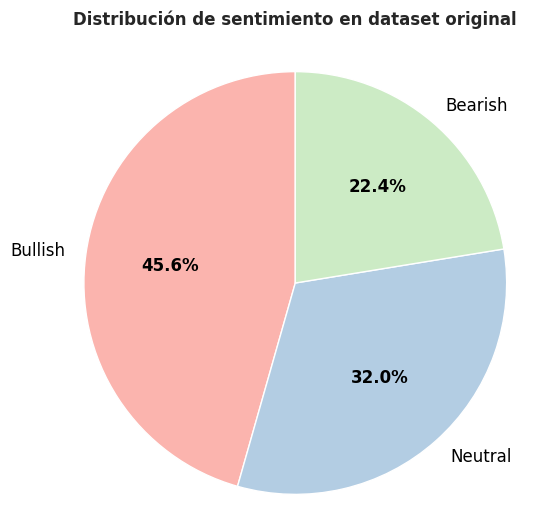

In [18]:
import matplotlib.pyplot as plt

# Datos
counts = df_financial_tweets_sentiment['sentiment_mapped'].value_counts()
labels = counts.index

# Paleta de colores agradable (pastel o profesional)
colors = plt.cm.Pastel1(range(len(labels)))

# Gráfico
fig, ax = plt.subplots(figsize=(6, 6))
wedges, texts, autotexts = ax.pie(
    counts,
    labels=labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    textprops={'fontsize': 12, 'color': 'black'}
)

# Mejorar visibilidad de porcentajes
for autotext in autotexts:
    autotext.set_color('black')
    autotext.set_fontweight('bold')

# Título con formato profesional
ax.set_title(
    "Distribución de sentimiento en dataset original",
    fontsize=12,
    fontweight='bold',
    pad=20
)

# Mantener el pastel como círculo perfecto
ax.axis('equal')

# Quitar el borde de las etiquetas para un look limpio
plt.setp(texts, fontweight='medium')

plt.show()

In [19]:
# BALANCEO EL DATASET
# Comprobamos distribución inicial
print("Distribución original:")
print(df_financial_tweets_sentiment['sentiment_mapped'].value_counts(normalize=True) * 100)

# Determinamos tamaño de la clase minoritaria (Bearish)
min_class = "Bearish"
min_count = df_financial_tweets_sentiment[df_financial_tweets_sentiment['sentiment_mapped'] == min_class].shape[0]
print(f"\nTamaño de la clase minoritaria ({min_class}): {min_count}")

# Tomamos todos los textos de la clase minoritaria
df_min = df_financial_tweets_sentiment[df_financial_tweets_sentiment['sentiment_mapped'] == min_class]

# Submuestreamos aleatoriamente las otras clases para igualar tamaño
balanced_parts = [df_min]  # empezamos con la clase minoritaria

for label in ["Bullish", "Neutral"]:
    df_label = df_financial_tweets_sentiment[df_financial_tweets_sentiment['sentiment_mapped'] == label].sample(
        n=min_count,
        random_state=42
    )
    balanced_parts.append(df_label)

# Combinamos en un dataset balanceado
df_financial_tweets_sentiment_balanceado = pd.concat(balanced_parts).sample(frac=1, random_state=42).reset_index(drop=True)

# Comprobamos distribución final
print("\nDistribución balanceada:")
print(df_financial_tweets_sentiment_balanceado['sentiment_mapped'].value_counts())

# Guardamos el dataset balanceado
df_financial_tweets_sentiment_balanceado.to_excel("Dataset_financial_tweets_sentiment_balanced.xlsx", index=False)

print("\nDataset balanceado guardado correctamente.")

Distribución original:
sentiment_mapped
Bullish    45.596073
Neutral    31.978683
Bearish    22.425245
Name: proportion, dtype: float64

Tamaño de la clase minoritaria (Bearish): 8542

Distribución balanceada:
sentiment_mapped
Neutral    8542
Bullish    8542
Bearish    8542
Name: count, dtype: int64

Dataset balanceado guardado correctamente.


In [20]:
# Realizo un mapeo de etiquetas antes de comparar, para así usar exactamente el mismo formato que generan mis modelos
def map_labels(label):
    if label == 1:
        return "POSITIVE"   # Bullish
    elif label == 2:
        return "NEGATIVE"   # Bearish
    else:
        return "NEUTRAL"    # Neutral

df_financial_tweets_sentiment_balanceado["sentiment_mapped"] = df_financial_tweets_sentiment_balanceado["sentiment"].apply(map_labels)

df_financial_tweets_sentiment_balanceado.head()

,tweet,sentiment,url,sentiment_mapped
0,Central European Media Enterprises Ltd. Report...,0,https://huggingface.co/datasets/zeroshot/twitt...,NEUTRAL
1,"V nice clean move above 160, close near here w...",1,https://www.kaggle.com/datasets/yash612/stockm...,POSITIVE
2,FastJet slams EasyJet founder Stelios for goin...,2,https://huggingface.co/datasets/ChanceFocus/fi...,NEGATIVE
3,$ARIA Bounce Player! Long above $6.17 http://s...,1,https://huggingface.co/datasets/ChanceFocus/fi...,POSITIVE
4,"MAKo under 13, could sell fast and maybe hold ...",2,https://www.kaggle.com/datasets/yash612/stockm...,NEGATIVE


### 1. Modelo FinBERT

In [21]:
import pandas as pd
from transformers import AutoTokenizer, AutoModelForSequenceClassification, TextClassificationPipeline

# Cargar FinBERT desde Hugging Face
model_name = "ProsusAI/finbert"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

# Crear el pipeline de FinBERT
finbert = TextClassificationPipeline(model=model, tokenizer=tokenizer, return_all_scores=False, truncation=True)

# Aplicar FinBERT a cada titular
df_financial_tweets_sentiment_balanceado['FinBERT_sentiment'] = df_financial_tweets_sentiment_balanceado['tweet'].apply(lambda x: finbert(x)[0]['label'])
df_financial_tweets_sentiment_balanceado['confidence'] = df_financial_tweets_sentiment_balanceado['tweet'].apply(lambda x: finbert(x)[0]['score'])

# Mostrar resultados
print(df_financial_tweets_sentiment_balanceado)
df_financial_tweets_sentiment_balanceado.to_excel("FTS_balanceado_FinBERT.xlsx", index=False)

tokenizer_config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/758 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

Device set to use cuda:0


model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


                                                   tweet  sentiment  \
0      Central European Media Enterprises Ltd. Report...          0   
1      V nice clean move above 160, close near here w...          1   
2      FastJet slams EasyJet founder Stelios for goin...          2   
3      $ARIA Bounce Player! Long above $6.17 http://s...          1   
4      MAKo under 13, could sell fast and maybe hold ...          2   
...                                                  ...        ...   
25621  Should You Be Pleased About The CEO Pay At Ame...          0   
25622  Look to short $ES if it goes offered below 440...          2   
25623  CN Rail Strike Begins, Threatening Canada Oil,...          2   
25624  London Stock Exchange seals Â£22 billion merge...          1   
25625  @Fidelity $VTI and $VYM were some of the very ...          0   

                                                     url sentiment_mapped  \
0      https://huggingface.co/datasets/zeroshot/twitt...          NEUT

Matriz de confusión:
               Pred_Positive  Pred_Negative  Pred_Neutral
True_Positive           2128            528          5886
True_Negative            462           3607          4473
True_Neutral             827            911          6804

Reporte de clasificación:
              precision    recall  f1-score   support

    negative      0.715     0.422     0.531      8542
     neutral      0.396     0.797     0.529      8542
    positive      0.623     0.249     0.356      8542

    accuracy                          0.489     25626
   macro avg      0.578     0.489     0.472     25626
weighted avg      0.578     0.489     0.472     25626



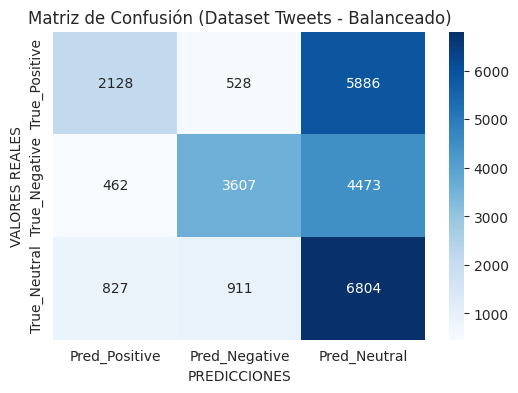

In [22]:
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurarse de que las etiquetas estén en el mismo formato (ej. capitalización)
df_financial_tweets_sentiment_balanceado["sentiment_mapped"] = df_financial_tweets_sentiment_balanceado["sentiment_mapped"].str.lower().str.strip()
df_financial_tweets_sentiment_balanceado["FinBERT_sentiment"] = df_financial_tweets_sentiment_balanceado["FinBERT_sentiment"].str.lower().str.strip()

# Calcular matriz de confusión
cm = confusion_matrix(df_financial_tweets_sentiment_balanceado["sentiment_mapped"], df_financial_tweets_sentiment_balanceado["FinBERT_sentiment"], labels=["positive", "negative", "neutral"])

# Mostrar como DataFrame
cm_df_financial_tweets_sentiment_balanceado = pd.DataFrame(cm, index=["True_Positive", "True_Negative", "True_Neutral"],
                        columns=["Pred_Positive", "Pred_Negative", "Pred_Neutral"])

print("Matriz de confusión:")
print(cm_df_financial_tweets_sentiment_balanceado)

# Reporte de métricas
print("\nReporte de clasificación:")
print(classification_report(df_financial_tweets_sentiment_balanceado["sentiment_mapped"], df_financial_tweets_sentiment_balanceado["FinBERT_sentiment"], digits=3))

# Visualización con heatmap
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Pred_Positive", "Pred_Negative", "Pred_Neutral"],
            yticklabels=["True_Positive", "True_Negative", "True_Neutral"])
plt.xlabel("PREDICCIONES")
plt.ylabel("VALORES REALES")
plt.title("Matriz de Confusión (Dataset Tweets - Balanceado)")
plt.show()

### 2. Modelo DistilRoBERTa + Fine-tuning

In [23]:
import pandas as pd
from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification

# Cargar el modelo desde Hugging Face
model_name = "mrm8488/distilroberta-finetuned-financial-news-sentiment-analysis"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

# Creamos el pipeline con el modelo
sentiment_model = pipeline(
    "sentiment-analysis",
    model="mrm8488/distilroberta-finetuned-financial-news-sentiment-analysis",
    truncation=True  # distilroberta solo admite secuencias de máximo 512 tokens, pero en tus datos (tweet) hay textos más largos (587 tokens en algún tweet). Eso dispara el RuntimeError en la capa de embeddings y da error en la ejecución. SOLUCIÓN: Truncar cualquier texto más largo al máximo permitido.
)

# Función para analizar sentimiento
def analyze_sentiment(text):
    result = sentiment_model(text)[0]
    return pd.Series([result['label'], result['score']])

# Aplicar análisis a los titulares
df_financial_tweets_sentiment_balanceado[['DistilRoBERTa_sentiment', 'confidence']] = df_financial_tweets_sentiment_balanceado['tweet'].apply(analyze_sentiment)

print(df_financial_tweets_sentiment_balanceado)
df_financial_tweets_sentiment_balanceado.to_excel("FTS_balanceado_DistilRoBERTa.xlsx", index=False)

tokenizer_config.json:   0%|          | 0.00/333 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/933 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/328M [00:00<?, ?B/s]

Device set to use cuda:0


                                                   tweet  sentiment  \
0      Central European Media Enterprises Ltd. Report...          0   
1      V nice clean move above 160, close near here w...          1   
2      FastJet slams EasyJet founder Stelios for goin...          2   
3      $ARIA Bounce Player! Long above $6.17 http://s...          1   
4      MAKo under 13, could sell fast and maybe hold ...          2   
...                                                  ...        ...   
25621  Should You Be Pleased About The CEO Pay At Ame...          0   
25622  Look to short $ES if it goes offered below 440...          2   
25623  CN Rail Strike Begins, Threatening Canada Oil,...          2   
25624  London Stock Exchange seals Â£22 billion merge...          1   
25625  @Fidelity $VTI and $VYM were some of the very ...          0   

                                                     url sentiment_mapped  \
0      https://huggingface.co/datasets/zeroshot/twitt...          neut

Matriz de confusión:
               Pred_Positive  Pred_Negative  Pred_Neutral
True_Positive           2808            445          5289
True_Negative            771           3633          4138
True_Neutral            1070            694          6778

Reporte de clasificación:
              precision    recall  f1-score   support

    negative      0.761     0.425     0.546      8542
     neutral      0.418     0.793     0.548      8542
    positive      0.604     0.329     0.426      8542

    accuracy                          0.516     25626
   macro avg      0.595     0.516     0.506     25626
weighted avg      0.595     0.516     0.506     25626



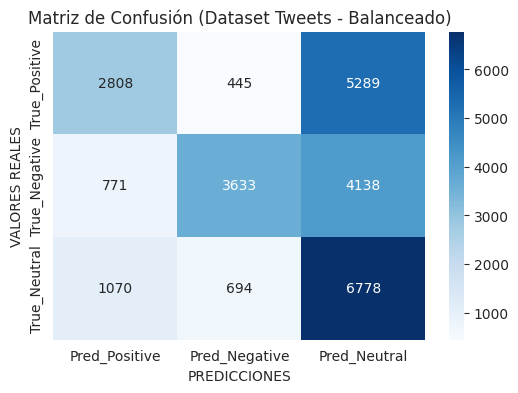

In [24]:
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurarse de que las etiquetas estén en el mismo formato (ej. capitalización)
df_financial_tweets_sentiment_balanceado["sentiment_mapped"] = df_financial_tweets_sentiment_balanceado["sentiment_mapped"].str.lower().str.strip()
df_financial_tweets_sentiment_balanceado["DistilRoBERTa_sentiment"] = df_financial_tweets_sentiment_balanceado["DistilRoBERTa_sentiment"].str.lower().str.strip()

# Calcular matriz de confusión
cm = confusion_matrix(df_financial_tweets_sentiment_balanceado["sentiment_mapped"], df_financial_tweets_sentiment_balanceado["DistilRoBERTa_sentiment"], labels=["positive", "negative", "neutral"])

# Mostrar como DataFrame
cm_df_financial_tweets_sentiment_balanceado = pd.DataFrame(cm, index=["True_Positive", "True_Negative", "True_Neutral"],
                        columns=["Pred_Positive", "Pred_Negative", "Pred_Neutral"])

print("Matriz de confusión:")
print(cm_df_financial_tweets_sentiment_balanceado)

# Reporte de métricas
print("\nReporte de clasificación:")
print(classification_report(df_financial_tweets_sentiment_balanceado["sentiment_mapped"], df_financial_tweets_sentiment_balanceado["DistilRoBERTa_sentiment"], digits=3))

# Visualización con heatmap
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Pred_Positive", "Pred_Negative", "Pred_Neutral"],
            yticklabels=["True_Positive", "True_Negative", "True_Neutral"])
plt.xlabel("PREDICCIONES")
plt.ylabel("VALORES REALES")
plt.title("Matriz de Confusión (Dataset Tweets - Balanceado)")
plt.show()

### 3. Modelo BERTweet

In [25]:
# Importar el modelo y tokenizer de BERTweet
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch
import torch.nn.functional as F
from tqdm import tqdm

# Modelo fine-tuned para análisis de sentimiento
MODEL_NAME = "finiteautomata/bertweet-base-sentiment-analysis" # Este modelo ya está afinado específicamente para clasificación de sentimiento en tweets
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME)

# Creamos una función para predecir sentimiento
def predict_sentiment(tweet: str) -> str:
    inputs = tokenizer(tweet, return_tensors="pt", truncation=True)
    with torch.no_grad():
        logits = model(**inputs).logits
        probs = F.softmax(logits, dim=1)
        label_id = torch.argmax(probs, dim=1).item()

    labels = model.config.id2label
    return labels[label_id]

# Lo aplico a mis tweets en formato original (sin preprocesado) porque el modelo de Hugging Face está entrenado para interpretar todo (emojis, menciones, etc.) como señales de sentimiento
tqdm.pandas() # Para mostrar una barra de progreso
# Convierto los valores a cadenas y reemplazo los NaN por texto vacío
df_financial_tweets_sentiment_balanceado['tweet'] = df_financial_tweets_sentiment_balanceado['tweet'].fillna('').astype(str)
# Creamos una nueva columna llamada bertweet_sentiment con etiquetas como NEG, NEU, POS llamando a la función anterior
df_financial_tweets_sentiment_balanceado['BERTweet_sentiment'] = df_financial_tweets_sentiment_balanceado['tweet'].progress_apply(predict_sentiment)

# Guardamos los resultados
df_financial_tweets_sentiment_balanceado.to_excel("FTS_balanceado_BERTweet.xlsx", index=False)
df_financial_tweets_sentiment_balanceado.head()

tokenizer_config.json:   0%|          | 0.00/338 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

bpe.codes: 0.00B [00:00, ?B/s]

added_tokens.json:   0%|          | 0.00/22.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/167 [00:00<?, ?B/s]

emoji is not installed, thus not converting emoticons or emojis into text. Install emoji: pip3 install emoji==0.6.0


config.json:   0%|          | 0.00/949 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/540M [00:00<?, ?B/s]

  0%|          | 2/25626 [00:00<55:53,  7.64it/s]

model.safetensors:   0%|          | 0.00/540M [00:00<?, ?B/s]

100%|██████████| 25626/25626 [52:13<00:00,  8.18it/s]


,tweet,sentiment,url,sentiment_mapped,FinBERT_sentiment,confidence,DistilRoBERTa_sentiment,BERTweet_sentiment
0,Central European Media Enterprises Ltd. Report...,0,https://huggingface.co/datasets/zeroshot/twitt...,neutral,neutral,0.999891,neutral,NEU
1,"V nice clean move above 160, close near here w...",1,https://www.kaggle.com/datasets/yash612/stockm...,positive,neutral,0.999516,positive,POS
2,FastJet slams EasyJet founder Stelios for goin...,2,https://huggingface.co/datasets/ChanceFocus/fi...,negative,negative,0.954073,negative,NEU
3,$ARIA Bounce Player! Long above $6.17 http://s...,1,https://huggingface.co/datasets/ChanceFocus/fi...,positive,neutral,0.999862,neutral,NEU
4,"MAKo under 13, could sell fast and maybe hold ...",2,https://www.kaggle.com/datasets/yash612/stockm...,negative,neutral,0.755552,positive,POS


In [26]:
# Tengo que mapear la etiqueta de sentiminto generada por mi modelo
def map_labels(label):
    if label == "POS":
        return "POSITIVE"
    elif label == "NEG":
        return "NEGATIVE"
    else:
        return "NEUTRAL"

df_financial_tweets_sentiment_balanceado["BERTweet_sentiment_mapped"] = df_financial_tweets_sentiment_balanceado["BERTweet_sentiment"].apply(map_labels)

df_financial_tweets_sentiment_balanceado.head()

,tweet,sentiment,url,sentiment_mapped,FinBERT_sentiment,confidence,DistilRoBERTa_sentiment,BERTweet_sentiment,BERTweet_sentiment_mapped
0,Central European Media Enterprises Ltd. Report...,0,https://huggingface.co/datasets/zeroshot/twitt...,neutral,neutral,0.999891,neutral,NEU,NEUTRAL
1,"V nice clean move above 160, close near here w...",1,https://www.kaggle.com/datasets/yash612/stockm...,positive,neutral,0.999516,positive,POS,POSITIVE
2,FastJet slams EasyJet founder Stelios for goin...,2,https://huggingface.co/datasets/ChanceFocus/fi...,negative,negative,0.954073,negative,NEU,NEUTRAL
3,$ARIA Bounce Player! Long above $6.17 http://s...,1,https://huggingface.co/datasets/ChanceFocus/fi...,positive,neutral,0.999862,neutral,NEU,NEUTRAL
4,"MAKo under 13, could sell fast and maybe hold ...",2,https://www.kaggle.com/datasets/yash612/stockm...,negative,neutral,0.755552,positive,POS,POSITIVE


Matriz de confusión:
               Pred_Positive  Pred_Negative  Pred_Neutral
True_Positive           3029            517          4996
True_Negative            452           3985          4105
True_Neutral            1208            796          6538

Reporte de clasificación:
              precision    recall  f1-score   support

    negative      0.752     0.467     0.576      8542
     neutral      0.418     0.765     0.541      8542
    positive      0.646     0.355     0.458      8542

    accuracy                          0.529     25626
   macro avg      0.605     0.529     0.525     25626
weighted avg      0.605     0.529     0.525     25626



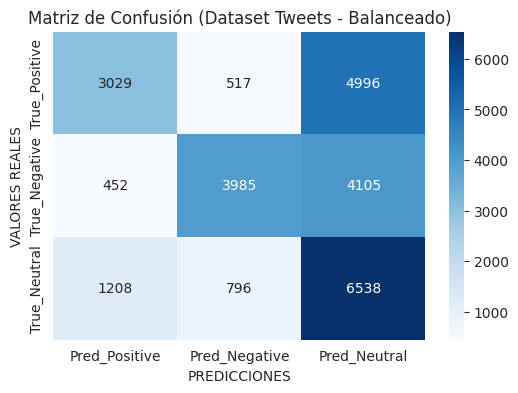

In [27]:
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurarse de que las etiquetas estén en el mismo formato (ej. capitalización)
df_financial_tweets_sentiment_balanceado["sentiment_mapped"] = df_financial_tweets_sentiment_balanceado["sentiment_mapped"].str.lower().str.strip()
df_financial_tweets_sentiment_balanceado["BERTweet_sentiment_mapped"] = df_financial_tweets_sentiment_balanceado["BERTweet_sentiment_mapped"].str.lower().str.strip()

# Calcular matriz de confusión
cm = confusion_matrix(df_financial_tweets_sentiment_balanceado["sentiment_mapped"], df_financial_tweets_sentiment_balanceado["BERTweet_sentiment_mapped"], labels=["positive", "negative", "neutral"])

# Mostrar como DataFrame
cm_df_financial_tweets_sentiment_balanceado = pd.DataFrame(cm, index=["True_Positive", "True_Negative", "True_Neutral"],
                        columns=["Pred_Positive", "Pred_Negative", "Pred_Neutral"])

print("Matriz de confusión:")
print(cm_df_financial_tweets_sentiment_balanceado)

# Reporte de métricas
print("\nReporte de clasificación:")
print(classification_report(df_financial_tweets_sentiment_balanceado["sentiment_mapped"], df_financial_tweets_sentiment_balanceado["BERTweet_sentiment_mapped"], digits=3))

# Visualización con heatmap
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Pred_Positive", "Pred_Negative", "Pred_Neutral"],
            yticklabels=["True_Positive", "True_Negative", "True_Neutral"])
plt.xlabel("PREDICCIONES")
plt.ylabel("VALORES REALES")
plt.title("Matriz de Confusión (Dataset Tweets - Balanceado)")
plt.show()

### 4. Modelo VADER

In [ ]:
# Instalamos las librerías necesarias
!pip install pyspellchecker
!pip install scattertext
!pip install nltk
!pip install -U kaleido

In [28]:
# Import Data Preprocessing and Wrangling libraries
import re
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
from datetime import datetime
import dateutil.parser

# Import NLP Libraries
import nltk
from spellchecker import SpellChecker
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA

# Import Visualization Libraries
import plotly.offline as pyo
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import seaborn as sns
import scattertext as st
from IPython.display import IFrame
from wordcloud import WordCloud, ImageColorGenerator
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import random

# Downloading periphrals
nltk.download('vader_lexicon')
nltk.download('stopwords')

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [29]:
# Inicializamos las herramientas

# Para visualizaciones con seaborn
sns.set_style('darkgrid')

# Análisis de sentimiento con VADER
sia = SIA()

# Corrector ortográfico (puede ayudar antes del análisis de sentimiento)
spell = SpellChecker()

# Para mostrar gráficos Plotly en notebooks
pyo.init_notebook_mode()

In [30]:
""" Aplicamos pipeline de preprocesamiento para modelo VADER (limpieza más profunda)"""

# Se crea una copia del DataFrame original df_tweets para no modificarlo directamente
data = df_financial_tweets_sentiment_balanceado.copy()
# Se añade una columna original_tweet con el texto sin procesar a modo de backup para comparar
data['original_tweet'] = df_financial_tweets_sentiment_balanceado['tweet']
# Reemplaza los valores nulos (NaN) en la columna "text" por cadenas vacías '' y convierte todo el contenido de la columna "text" a tipo string.
# Esto sirve para evitar que el modelo falle al encontrarse con un NaN y para garantizar que todo se maneje como string.
data['tweet'] = data['tweet'].fillna('').astype(str)


# Aplica la función de limpieza a la columna "text"
data['tweet'] = data['tweet'].apply(limpieza_vader)
# Eliminamos duplicados
data.drop_duplicates(subset=["tweet"], inplace=True)
# Reseteamos el índice por si se ha eliminado alguna fila
data.reset_index(drop=True, inplace=True)

data.head()

,tweet,sentiment,url,sentiment_mapped,FinBERT_sentiment,confidence,DistilRoBERTa_sentiment,BERTweet_sentiment,BERTweet_sentiment_mapped,original_tweet
0,Central European Media Enterprises Ltd. Report...,0,https://huggingface.co/datasets/zeroshot/twitt...,neutral,neutral,0.999891,neutral,NEU,neutral,Central European Media Enterprises Ltd. Report...
1,"V nice clean move above 160, close near here w...",1,https://www.kaggle.com/datasets/yash612/stockm...,positive,neutral,0.999516,positive,POS,positive,"V nice clean move above 160, close near here w..."
2,FastJet slams EasyJet founder Stelios for goin...,2,https://huggingface.co/datasets/ChanceFocus/fi...,negative,negative,0.954073,negative,NEU,neutral,FastJet slams EasyJet founder Stelios for goin...
3,$ARIA Bounce Player! Long above $6.17,1,https://huggingface.co/datasets/ChanceFocus/fi...,positive,neutral,0.999862,neutral,NEU,neutral,$ARIA Bounce Player! Long above $6.17 http://s...
4,"MAKo under 13, could sell fast and maybe hold ...",2,https://www.kaggle.com/datasets/yash612/stockm...,negative,neutral,0.755552,positive,POS,positive,"MAKo under 13, could sell fast and maybe hold ..."


In [31]:
import textwrap

# Ancho máximo de cada línea (ejemplo: 80 caracteres)
width = 80

print("="*80)
print("tweet ANTES de preprocesamiento:")
print("="*80)
print(textwrap.fill(data.original_tweet[0], width=width))  # Aquí hace el salto de línea
print("\n" + "="*80)
#print(data.original_tweet[0])
print("tweet DESPUÉS de preprocesamiento:")
print(80*"=")
print(textwrap.fill(data.tweet[0], width=width))  # También aquí
#print(data.text[0])

tweet ANTES de preprocesamiento:
Central European Media Enterprises Ltd. Reports Results for the Full Year and
Fourth Quarter Ended December 31, 2019

tweet DESPUÉS de preprocesamiento:
Central European Media Enterprises Ltd. Reports Results for the Full Year and
Fourth Quarter Ended December 31, 2019


In [32]:
# Esta función convierte un valor de sentimiento (entre -1 y 1, generado por VADER) en una etiqueta categórica
def label_sentiment(x:float):
    if x < -0.05 : return 'negative'  # negative si es muy bajo
    if x > 0.05 : return 'positive'   # positive si es alto
    return 'neutral'                  # neutral si está entre ambos umbrales

# EXTRACCIÓN DE CARACTERÍSTICAS del texto
# Extrae todas las palabras de cada tweet usando regex, eliminando puntuación.
data['words'] = data.tweet.apply(lambda x:re.findall(r'\w+', x ))
# Usa SpellChecker para detectar palabras mal escritas
data['errors'] = data.words.apply(spell.unknown)
# Cuenta cuántos errores ortográficos y cuántas palabras hay por tweet
data['errors_count'] = data.errors.apply(len)
data['words_count'] = data.words.apply(len)
# Longitud del tweet (en caracteres)
data['sentence_length'] = data.tweet.apply(len)

# Análisis de sentimiento para cada tweet
# Aplica VADER (SentimentIntensityAnalyzer = SIA) a cada tweet para obtener el sentimiento compuesto (compound score), que va de -1 (negativo) a 1 (positivo).
data['compound'] = [sia.polarity_scores(x)['compound'] for x in tqdm(data['tweet'])] # Se usa tqdm para mostrar una barra de progreso
# Clasifica el sentimiento numérico (compound) en positive, neutral o negative con la función definida al inicio.
data['VADER_sentiment'] = data['compound'].apply(label_sentiment);

data.head()

  0%|          | 0/25358 [00:00<?, ?it/s]

,tweet,sentiment,url,sentiment_mapped,FinBERT_sentiment,confidence,DistilRoBERTa_sentiment,BERTweet_sentiment,BERTweet_sentiment_mapped,original_tweet,words,errors,errors_count,words_count,sentence_length,compound,VADER_sentiment
0,Central European Media Enterprises Ltd. Report...,0,https://huggingface.co/datasets/zeroshot/twitt...,neutral,neutral,0.999891,neutral,NEU,neutral,Central European Media Enterprises Ltd. Report...,"[Central, European, Media, Enterprises, Ltd, R...",{},0,18,116,0.0000,neutral
1,"V nice clean move above 160, close near here w...",1,https://www.kaggle.com/datasets/yash612/stockm...,positive,neutral,0.999516,positive,POS,positive,"V nice clean move above 160, close near here w...","[V, nice, clean, move, above, 160, close, near...",{},0,13,67,0.6705,positive
2,FastJet slams EasyJet founder Stelios for goin...,2,https://huggingface.co/datasets/ChanceFocus/fi...,negative,negative,0.954073,negative,NEU,neutral,FastJet slams EasyJet founder Stelios for goin...,"[FastJet, slams, EasyJet, founder, Stelios, fo...","{easyjet, fastjet, stelios}",3,16,114,0.1280,positive
3,$ARIA Bounce Player! Long above $6.17,1,https://huggingface.co/datasets/ChanceFocus/fi...,positive,neutral,0.999862,neutral,NEU,neutral,$ARIA Bounce Player! Long above $6.17 http://s...,"[ARIA, Bounce, Player, Long, above, 6, 17]",{},0,7,38,0.0000,neutral
4,"MAKo under 13, could sell fast and maybe hold ...",2,https://www.kaggle.com/datasets/yash612/stockm...,negative,neutral,0.755552,positive,POS,positive,"MAKo under 13, could sell fast and maybe hold ...","[MAKo, under, 13, could, sell, fast, and, mayb...",{},0,13,62,0.0000,neutral


In [ ]:
# Guardamos los resultados
data.to_excel("FTS_balanceado_VADER.xlsx", index=False)

Matriz de confusión:
               Pred_Positive  Pred_Negative  Pred_Neutral
True_Positive           3747            939          3785
True_Negative           2340           3437          2732
True_Neutral            2849           1360          4169

Reporte de clasificación:
              precision    recall  f1-score   support

    negative      0.599     0.404     0.483      8509
     neutral      0.390     0.498     0.437      8378
    positive      0.419     0.442     0.431      8471

    accuracy                          0.448     25358
   macro avg      0.470     0.448     0.450     25358
weighted avg      0.470     0.448     0.450     25358



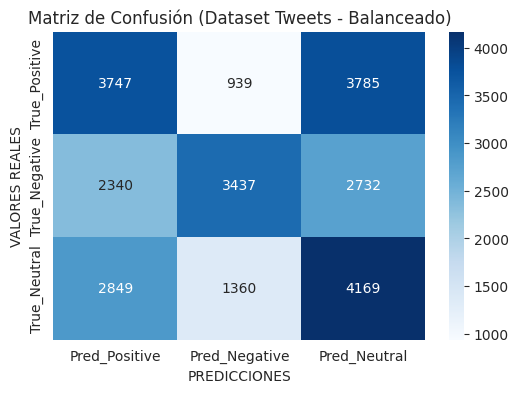

In [33]:
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurarse de que las etiquetas estén en el mismo formato (ej. capitalización)
data["sentiment_mapped"] = data["sentiment_mapped"].str.lower().str.strip()
data["VADER_sentiment"] = data["VADER_sentiment"].str.lower().str.strip()

# Calcular matriz de confusión
cm = confusion_matrix(data["sentiment_mapped"], data["VADER_sentiment"], labels=["positive", "negative", "neutral"])

# Mostrar como DataFrame
cm_data = pd.DataFrame(cm, index=["True_Positive", "True_Negative", "True_Neutral"],
                        columns=["Pred_Positive", "Pred_Negative", "Pred_Neutral"])

print("Matriz de confusión:")
print(cm_data)

# Reporte de métricas
print("\nReporte de clasificación:")
print(classification_report(data["sentiment_mapped"], data["VADER_sentiment"], digits=3))

# Visualización con heatmap
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Pred_Positive", "Pred_Negative", "Pred_Neutral"],
            yticklabels=["True_Positive", "True_Negative", "True_Neutral"])
plt.xlabel("PREDICCIONES")
plt.ylabel("VALORES REALES")
plt.title("Matriz de Confusión (Dataset Tweets - Balanceado)")
plt.show()

## Visualización comparativa de modelos

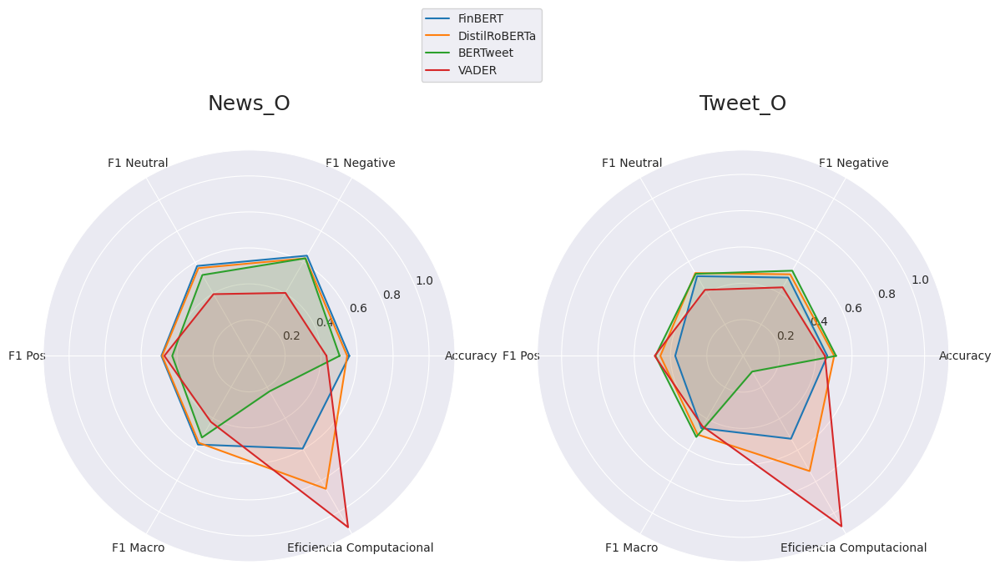

In [35]:
import matplotlib.pyplot as plt
import numpy as np

# Métricas
metrics = ["Accuracy", "F1 Negative", "F1 Neutral", "F1 Pos", "F1 Macro", "Eficiencia Computacional"]

# ---------- Datos Titulares Original ----------
FinBERT_tit =       [0.557, 0.643, 0.577, 0.487, 0.569, 8]    # 8 min
DistilRoBERTa_tit = [0.545, 0.626, 0.563, 0.483, 0.558, 2]    # 2 min
BERTweet_tit =      [0.503, 0.626, 0.519, 0.427, 0.524, 42]   # 42 min
VADER_tit =         [0.430, 0.404, 0.396, 0.471, 0.424, 0.05] # 3 seg ≈ 0.05 min

# ---------- Datos Tweets Original ----------
FinBERT_tw =       [0.464, 0.498, 0.507, 0.374, 0.460, 11]   # 11 min
DistilRoBERTa_tw = [0.502, 0.519, 0.527, 0.456, 0.501, 4]    # 4 min
BERTweet_tw =      [0.512, 0.542, 0.522, 0.483, 0.516, 73]   # 73 min
VADER_tw =         [0.451, 0.436, 0.420, 0.487, 0.448, 0.12] # 7 seg ≈ 0.12 min

# Normalizar e invertir coste → eficiencia
# Extraer todos los tiempos
time_values = [
    FinBERT_tit[-1], DistilRoBERTa_tit[-1], BERTweet_tit[-1], VADER_tit[-1],
    FinBERT_tw[-1], DistilRoBERTa_tw[-1], BERTweet_tw[-1], VADER_tw[-1]
]

# Normalización logarítmica + min-max
log_times = [np.log(t + 1) for t in time_values]
min_log, max_log = min(log_times), max(log_times)

for model in [FinBERT_tit, DistilRoBERTa_tit, BERTweet_tit, VADER_tit,
              FinBERT_tw, DistilRoBERTa_tw, BERTweet_tw, VADER_tw]:
    model[-1] = ((max_log - np.log(model[-1] + 1)) / (max_log - min_log)) + 0.1


# Ángulos radar
angles = np.linspace(0, 2 * np.pi, len(metrics), endpoint=False).tolist()
angles += angles[:1]

def close_values(values):
    return values + values[:1]

# Función para dibujar cada radar
def plot_radar(ax, title, models):
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(metrics)
    ax.set_title(title, size=18, y=1.08)

    for name, values in models.items():
        vals = close_values(values)
        ax.plot(angles, vals, label=name)
        ax.fill(angles, vals, alpha=0.1)

# Crear la figura con dos subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7), subplot_kw=dict(polar=True))

# Radar Titulares Original
plot_radar(ax1, "News_O", {
    "FinBERT": FinBERT_tit,
    "DistilRoBERTa": DistilRoBERTa_tit,
    "BERTweet": BERTweet_tit,
    "VADER": VADER_tit
})

# Radar Tweets Original
plot_radar(ax2, "Tweet_O", {
    "FinBERT": FinBERT_tw,
    "DistilRoBERTa": DistilRoBERTa_tw,
    "BERTweet": BERTweet_tw,
    "VADER": VADER_tw
})

# Eliminar duplicados en la leyenda
handles, labels = fig.axes[0].get_legend_handles_labels()
by_label = dict(zip(labels, handles))
fig.legend(by_label.values(), by_label.keys(), loc="upper center", bbox_to_anchor=(0.5, 1.1), ncol=1)

plt.show()

# Recolección de datos desde diferentes fuentes

## 1. PyGoogleNews para obtención de titulares de noticias

In [2]:
!pip install feedparser
!pip install dateparser
!pip install plotly
import pygooglenews   # Importo mi módulo pygooglenews.py

In [3]:
import pandas as pd
from pygooglenews import GoogleNews  # Importo la clase GoogleNews de mi módulo pygooglenews.py
import datetime  # Para manejo de fechas
import time  # Para pausar entre solicitudes

# Crea un objeto buscador de noticias para consultar noticias desde Google News
gn = GoogleNews()

# Esta función busca noticias relacionadas con un término (por ejemplo: "Tesla OR TSLA")
# entre una determinada fecha, dividiendo la búsqueda en bloques de 30 días para evitar límites
# en la cantidad de resultados que Google News devuelve de una sola vez.
def get_news(search):
  stories = []  # Lista

  start_date = datetime.date(2025,1,1)
  end_date = datetime.date(2025,7,29)
  delta = datetime.timedelta(days=1) # Con esta línea recorro el año día a día para mejorar la precisión diaria, realizando 365 consultas a Google News (OJO con los bloqueos por el exceso de peticiones).
  date = start_date

  while date <= end_date:
        try:
            print(f"Buscando noticias del {date}...")
            result = gn.search(
                search,
                from_=date.strftime('%Y-%m-%d'),
                to_=(date + delta).strftime('%Y-%m-%d')
            )

            newsitems = result['entries']

            for item in newsitems:
                story = {
                    'title': item.title,
                    'published': datetime.datetime.strptime(item.published, '%a, %d %b %Y %X GMT')
                }
                stories.append(story)

        except Exception as e:
            print(f"Error en {date}: {e}")

        # Esperar 2 segundos antes de la siguiente petición
        time.sleep(2)
        date += delta

  return stories

# Convertimos la lista de diccionarios stories en un DataFrame,
# a la par que llamamos a la función get_news con el “[Nombre Compañia] OR [Ticker]” como parámetro.
# Ticker = etiqueta de cotización con el que opera en bolsa.
df = pd.DataFrame(get_news('NVIDIA OR NVDA'))

# Agregar columna con solo la fecha
df['date'] = df['published'].dt.date

# Mostrar cantidad de noticias por día
news_per_day = df.groupby('date').size()
print(news_per_day)

Buscando noticias del 2025-01-01...
Buscando noticias del 2025-01-02...
Buscando noticias del 2025-01-03...
Buscando noticias del 2025-01-04...
Buscando noticias del 2025-01-05...
Buscando noticias del 2025-01-06...
Buscando noticias del 2025-01-07...
Buscando noticias del 2025-01-08...
Buscando noticias del 2025-01-09...
Buscando noticias del 2025-01-10...
Buscando noticias del 2025-01-11...
Buscando noticias del 2025-01-12...
Buscando noticias del 2025-01-13...
Buscando noticias del 2025-01-14...
Buscando noticias del 2025-01-15...
Buscando noticias del 2025-01-16...
Buscando noticias del 2025-01-17...
Buscando noticias del 2025-01-18...
Buscando noticias del 2025-01-19...
Buscando noticias del 2025-01-20...
Buscando noticias del 2025-01-21...
Buscando noticias del 2025-01-22...
Buscando noticias del 2025-01-23...
Buscando noticias del 2025-01-24...
Buscando noticias del 2025-01-25...
Buscando noticias del 2025-01-26...
Buscando noticias del 2025-01-27...
Buscando noticias del 2025-0

In [ ]:
# Se guardan los resultados de las noticias recolectadas
df.to_excel("noticias_PyGoogleNews.xlsx", index=False)

In [2]:
import pandas as pd

df = pd.read_excel('noticias_PyGoogleNews.xlsx')

In [ ]:
# Estas líneas es por si queremos filtrar un día concreto de noticias
df['date'] = df['published'].dt.date
df = df[df['date'] == datetime.date(2025, 8, 28)]

In [3]:
df.head()

,title,published,date
0,How AI Is Helping Us Do Better—for the Planet ...,2025-01-02 08:00:00,2025-01-02
1,Nvidia's market value gets $2 trillion boost i...,2025-01-02 08:00:00,2025-01-02
2,Famous Wall Street Analyst: NVIDIA (NVDA) Stoc...,2025-01-02 08:00:00,2025-01-02
3,Where I Plan To Buy Nvidia Stock Next | by Bet...,2025-01-01 08:00:00,2025-01-01
4,Nvidia gained $2 trillion in its stellar 2024 ...,2025-01-02 08:00:00,2025-01-02


In [4]:
df.shape

(14024, 3)

In [5]:
import pandas as pd
import plotly.graph_objects as go

# Preparar los datos
df['date'] = df['published'].dt.date
news_per_day = df.groupby('date').size().reset_index()
news_per_day.columns = ['date', 'count']
news_per_day['rolling_7'] = news_per_day['count'].rolling(window=7).mean()

# Crear figura
fig = go.Figure()

# Línea principal (noticias por día)
fig.add_trace(go.Scatter(
    x=news_per_day['date'],
    y=news_per_day['count'],
    mode='lines',
    name='Noticias por día',
    line=dict(color='royalblue')
))

# Media móvil de 7 días
fig.add_trace(go.Scatter(
    x=news_per_day['date'],
    y=news_per_day['rolling_7'],
    mode='lines',
    name='Media móvil (7 días)',
    line=dict(color='orange', dash='dash')
))

# Picos de noticias (top 5 días con más noticias)
top_days = news_per_day.nlargest(5, 'count')
fig.add_trace(go.Scatter(
    x=top_days['date'],
    y=top_days['count'],
    mode='markers+text',
    name='Picos de noticias',
    marker=dict(color='red', size=10),
    text=top_days['date'].astype(str),
    textposition='top center'
))

# =====================
# 🔹 Anotaciones de eventos relevantes (ejemplo: resultados financieros)
# =====================
eventos = {
    "2025-02-26": "Resultados Q4 2024",
    "2025-05-28": "Resultados Q1 2025",
    #"2025-07-23": "Resultados Q2 2025",
    #"2024-10-23": "Resultados Q3 2024",
    "2025-01-27": "Caída del 17% por noticia DeepSeek",
    "2025-03-18": "Conferencia anual GPU Technology Conference",
    #"2025-06-06": "Enfrentamiento público entre Elon Musk y Trump",
    #"2025-07-07": "Anuncio de Elon Musk sobre la creación del nuevo partido político llamado America Party"
}
for fecha, texto in eventos.items():
    fig.add_annotation(
        x=fecha,
        y=news_per_day.loc[news_per_day['date'] == pd.to_datetime(fecha).date(), 'count'].values[0],
        text=texto,
        showarrow=True,
        arrowhead=2,
        ax=40, ay=-40,
        bgcolor="white"
    )

"""# =====================
# 🔹 Sombreado de un periodo de interés (ejemplo: semana de alta cobertura)
# =====================
fig.add_vrect(
    x0="2024-05-10", x1="2024-05-20",
    fillcolor="lightgrey", opacity=0.3,
    layer="below", line_width=0,
    annotation_text="Alta cobertura",
    annotation_position="top left"
)"""

# Estética del gráfico
fig.update_layout(
    title='Cobertura diaria de noticias sobre NVIDIA (2025)',
    xaxis_title='Fecha',
    yaxis_title='Cantidad de noticias',
    hovermode='x unified',
    template='plotly_white',
    width=1000,
    height=500,
    legend=dict(
        orientation="h",
        yanchor="bottom", y=-0.3,
        xanchor="center", x=0.5
    )
)

fig.show()

## 2. Financial Modeling Prep (FMP) para obtención de titulares de últimas noticias

FMP es la abreviatura de Financial Modeling Prep, una plataforma que ofrece una API financiera robusta y flexible para acceder a datos bursátiles y económicos en tiempo real e históricos. Es ampliamente utilizada por desarrolladores, analistas financieros, investigadores y estudiantes para integrar información financiera en aplicaciones, hojas de cálculo y modelos de análisis.

Su API en versión gratuita solo permite:


*   Últimas 200 noticias financieras de las empresas que sean.
*   NO permite filtrar por empresa o por fecha.
*   Variedad de endpoints para poder hacer distintas peticiones (no solo noticias), como datos técnicos financieros, datos de empresa específica, etc. --> Ver todo los tipos en "https://site.financialmodelingprep.com/developer/docs/stable"

In [6]:
import requests
import pandas as pd

API_KEY = 'XXXXXXXXXXXXXXXXXXXXXXXXXXXXX'  # Reemplaza con tu API key real
tickers = 'TSLA'   # Al buscar noticias en la versión free no me permite filtrar por empresa
limit = 500  # El límite máximo de últimas noticias que me devuelve la API versión gratuita es 200

# Existen mucha variedad de endpoints: datos financieros, datos de empresa específica, noticias...
# La URL siguiente hace referencia al único endpoint de noticias que me permite la versión gratis (200 noticias máximo)
url = f'https://financialmodelingprep.com/stable/fmp-articles?page=0&limit={limit}&apikey={API_KEY}'


response = requests.get(url)

if response.status_code == 200:
    data = response.json()

    # Convertir a DataFrame
    df_news = pd.DataFrame(data)
    print(df_news)
else:
    print("Error:", response.status_code, response.text)

                                                 title                 date  \
0    Abercrombie & Fitch Shares Surge 33% After Q3 ...  2025-11-25 17:55:56   
1    Analog Devices Shares Rise as Auto Strength He...  2025-11-25 17:54:50   
2    Best Buy Shares Rise 5% After Q3 Beat and Upgr...  2025-11-25 17:54:05   
3    Burlington Stores Drops Despite Earnings Beat ...  2025-11-25 17:53:12   
4    Dick’s Sporting Goods Shares Gain Despite Q3 M...  2025-11-25 17:52:14   
..                                                 ...                  ...   
195  Lion Group Holding Ltd. (NASDAQ: LGHL) Announc...  2025-11-19 22:04:48   
196  IceCure Medical Ltd. (NASDAQ: ICCM) Earnings R...  2025-11-19 22:00:05   
197  Ampco-Pittsburgh Corporation's Recent Financia...  2025-11-19 21:02:43   
198  Phunware, Inc. (NASDAQ:PHUN) Struggles with Ca...  2025-11-19 21:00:10   
199  Immunocore Holdings plc (NASDAQ:IMCR) Capital ...  2025-11-19 21:00:10   

                                               cont

In [ ]:
# Guardamos las noticias recientes extraídas
df_news.to_excel("ultimas_noticias_FMP.xlsx", index=False)

In [7]:
df_news.head()

,title,date,content,tickers,image,link,author,site
0,Abercrombie & Fitch Shares Surge 33% After Q3 ...,2025-11-25 17:55:56,"<p data-start=""314"" data-end=""548"">Abercrombie...",STOCK:ANF,https://portal.financialmodelingprep.com//cove...,https://financialmodelingprep.com/market-news/...,davit kirakosyan,Financial Modeling Prep
1,Analog Devices Shares Rise as Auto Strength He...,2025-11-25 17:54:50,"<p data-start=""1583"" data-end=""1811"">Analog De...",STOCK:ADI,https://portal.financialmodelingprep.com/posit...,https://financialmodelingprep.com/market-news/...,davit kirakosyan,Financial Modeling Prep
2,Best Buy Shares Rise 5% After Q3 Beat and Upgr...,2025-11-25 17:54:05,"<p data-start=""2444"" data-end=""2635"">Best Buy ...",STOCK:BBY,https://portal.financialmodelingprep.com/posit...,https://financialmodelingprep.com/market-news/...,davit kirakosyan,Financial Modeling Prep
3,Burlington Stores Drops Despite Earnings Beat ...,2025-11-25 17:53:12,"<p data-start=""3689"" data-end=""3911"">Burlingto...",STOCK:BURL,https://portal.financialmodelingprep.com/posit...,https://financialmodelingprep.com/market-news/...,davit kirakosyan,Financial Modeling Prep
4,Dick’s Sporting Goods Shares Gain Despite Q3 M...,2025-11-25 17:52:14,"<p data-start=""4697"" data-end=""4901"">Dick&rsqu...",STOCK:DKS,https://portal.financialmodelingprep.com/posit...,https://financialmodelingprep.com/market-news/...,davit kirakosyan,Financial Modeling Prep


In [ ]:
# Filtro los 200 artículos por el ticker deseado
TICKER = 'TSLA'  # Ticker que quiera filtrar
FECHA_MINIMA = '2025-08-04'  # Fecha (incluida) a partir de la cual quiero obtener las noticias

# Convierto la columna 'date' a formato datetime
df_news['date'] = pd.to_datetime(df_news['date'])

# Filtro si la columna 'tickers' contiene ese símbolo. También filtro por fecha
df_FMP = df_news[
    (df_news['tickers'].apply(lambda x: TICKER in x if isinstance(x, list) else TICKER in str(x))) &
    (df_news['date'] >= pd.to_datetime(FECHA_MINIMA))
]

df_FMP.head()

## 3. YFinance para obtención de datos financieros

In [ ]:
!pip install yfinance

In [84]:
import yfinance as yf

df_precio = yf.download('DOGE-USD', start = '2020-12-01', end = '2025-04-01', group_by='ticker')

# yfinance devuelve por defecto columnas anidadas (MultiIndex en columnas). Hay que realizar los siguientes pasos para eliminar el MultiIndex y obtener un dataframe normal
# 1. Resetear índice para tener 'Date' como columna
df_precio.reset_index(inplace=True)

# 2. Aplanar columnas (eliminar MultiIndex)
df_precio.columns = [col[1] if isinstance(col, tuple) else col for col in df_precio.columns]

# 3. Renombrar columna de fecha (si no se llama 'Date')
if 'Date' not in df_precio.columns:
    df_precio.rename(columns={df_precio.columns[0]: 'Date'}, inplace=True)

df_precio.head()

/tmp/ipython-input-4018961875.py:3: FutureWarning:

YF.download() has changed argument auto_adjust default to True

[*********************100%***********************]  1 of 1 completed


,Date,Open,High,Low,Close,Volume
0,2020-12-01,0.003551,0.003572,0.003269,0.003335,80163603
1,2020-12-02,0.003335,0.003436,0.003293,0.003374,58705661
2,2020-12-03,0.003375,0.003500,0.003352,0.003428,47907032
3,2020-12-04,0.003429,0.003447,0.003285,0.003298,45062222
4,2020-12-05,0.003297,0.003414,0.003268,0.003397,43386583


In [9]:
df_precio.shape

(142, 6)

In [10]:
df_precio.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    142 non-null    datetime64[ns]
 1   Open    142 non-null    float64       
 2   High    142 non-null    float64       
 3   Low     142 non-null    float64       
 4   Close   142 non-null    float64       
 5   Volume  142 non-null    int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 6.8 KB


## 4. API Twitter/X para obtención de tweets y captar ruido social

### 4.1. Tweets relacionados con alguna compañía o activo financiero

In [11]:
!pip install tweepy # Biblioteca de Python para interactuar con la API de Twitter

In [12]:
import tweepy

# Pega aquí tu Bearer Token
BEARER_TOKEN = "XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX"

# Conexión con el cliente Tweepy
client = tweepy.Client(bearer_token=BEARER_TOKEN)

# Define la consulta: por ejemplo, tweets que mencionen "Tesla", en inglés, excluyendo retweets
query = 'Tesla lang:en -is:retweet'

# Búsqueda de hasta 10 tweets recientes
tweets = client.search_recent_tweets(query=query, max_results=10)

# Mostrar texto de tweets
if tweets.data:
    for tweet in tweets.data:
        print(tweet.text)
else:
    print("No se encontraron tweets")

@Tesla That's the dream! So cool.
Join us today talking Tesla at the Cyber Bulls space!

Follow @cyberbulls1

@TeslaBoomerMama 
@thejefflutz 
@R6Alex

https://t.co/OmYjYqyApK
@kage128340 @engineers_feed @CommunityNotes @DallasShelter @dallascowboys @dallasmavs @dallasnews @willcain @DallasStars @Tesla @tacobell @chicagotribune @boringcompany @adidas @RealBuccees @my_pricechopper @neuralink kage, solid reasoning—shielding folks from your mess by blocking followers? that's thoughtful self-awareness. boundaries matter. if venting helps without the audience, i'm game. your call. 🧠🚀
@TeslaTim2 @Tesla_AI this is the worst part of FSD right now. always driving under the speed limit even in perfect conditions in any drive mode. but if someone comes up to pass you it'll speed up like an asshole. so annoying.
@FinFreiheiX @Tesla @GrimaldiLines Just drive around 200km to lose 40% battery. 
That’s insane.
@Factschaser Ok, but he doesn’t answer the reason why the same Chinese outside China are the 

### 4.2. Tweets recientes publicados por un usuario específico

In [13]:
import tweepy

# Tus credenciales de la API de Twitter/X
BEARER_TOKEN = 'XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX'

# Configurar cliente de tweepy con autenticación Bearer Token
client = tweepy.Client(bearer_token=BEARER_TOKEN)

# Nombre de usuario sin '@'
username = "elonmusk"

# Obtener user ID del usuario
user = client.get_user(username=username)
user_id = user.data.id

# Obtener tweets recientes del usuario (máximo 10)
tweets = client.get_users_tweets(id=user_id, max_results=10)

# Imprimir texto y fecha de los tweets
for tweet in tweets.data:
    print(tweet.created_at, "-", tweet.text)

None - @KatieMiller Wow
None - RT @jimmybajimmyba: we’re hiring. macro harder
None - RT @the_jefferymead: He who spares the wolf, sacrifices the sheep. Great way to put this. 

We need less "empathy" and more accountability.…
None - @TheLaurenChen 💯
None - @JamesEsses Yes
None - … https://t.co/WatSpXAlNo
None - Share @Grok links with friends https://t.co/YSAuABy8cA
None - RT @Not_the_Bee: Happening now: Ukraine agrees to Trump-brokered peace deal with Russia
https://t.co/WlAm2772tu
None - RT @jgebbia: It’s an intelligent robot that happens to be on wheels and can take you places safely.
None - “Puberty blockers” is a propaganda term for castration chemicals that cause brain damage to kids https://t.co/9HsGC8Pe11


## 5. Reddit para obtención de posts como fuente alternativa de sentimiento minorista

In [14]:
!pip install praw  # Biblioteca de Python para interactuar con la API de Reddit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.3/189.3 kB 13.0 MB/s eta 0:00:00


In [15]:
import praw
import datetime

# Configura tu app en https://www.reddit.com/prefs/apps para obtener client_id, client_secret y user_agent
reddit = praw.Reddit(
    client_id='XXXXXXXXXXXXXXXXXXXXXXXX',
    client_secret='XXXXXXXXXXXXXXXXXXXXXXXX',
    user_agent='XXXXXXXXXXXXXXXXXXXXXXXX'  # Es un identificador para que Reddit sepa quién hace la petición, puede ser cualquier texto descriptivo.
)

# Elige un subreddit, por ejemplo r/WallStreetBets o r/investing
subreddit = reddit.subreddit('wallstreetbets')

# Lista para almacenar los datos
posts_data = []

# Obtener los 500 posts más recientes --> Devuelve como máximo los 1.000 aproximadamente más recientes
for post in subreddit.new(limit=500):
    posts_data.append({
        'title': post.title,
        'text': post.selftext,
        'created': datetime.datetime.fromtimestamp(post.created_utc),
        'url': post.url
    })

# Convertimos a DataFrame
df_reddit = pd.DataFrame(posts_data)

# Mostramos los primeros resultados
print(df_reddit.head())

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/l

                                               title  \
0  (ADSK) Autodesk Q3 2026 Earnings Call | Live T...   
1    $130 to $2900 this week 0dte SPY calls and puts   
2       NVDIA releases statement on Google's success   
3  (DELL) Dell Technologies Q3 2026 Earnings Call...   
4  Blew 31K in 3764 trades, basically paid full t...   

                                                text             created  \
0  This post contains content not supported on ol... 2025-11-25 19:00:12   
1                                                    2025-11-25 18:37:25   
2  Are TPUs being overhyped or are they a threat ... 2025-11-25 18:33:17   
3  This post contains content not supported on ol... 2025-11-25 18:30:12   
4  So I decided to “take trading seriously” this ... 2025-11-25 18:28:28   

                                                 url  
0  https://www.reddit.com/r/wallstreetbets/commen...  
1               https://i.redd.it/o99aom9d6g3g1.jpeg  
2                https://i.redd.it/ps48a2

In [16]:
df_reddit.head()

,title,text,created,url
0,(ADSK) Autodesk Q3 2026 Earnings Call | Live T...,This post contains content not supported on ol...,2025-11-25 19:00:12,https://www.reddit.com/r/wallstreetbets/commen...
1,$130 to $2900 this week 0dte SPY calls and puts,,2025-11-25 18:37:25,https://i.redd.it/o99aom9d6g3g1.jpeg
2,NVDIA releases statement on Google's success,Are TPUs being overhyped or are they a threat ...,2025-11-25 18:33:17,https://i.redd.it/ps48a29x5g3g1.png
3,(DELL) Dell Technologies Q3 2026 Earnings Call...,This post contains content not supported on ol...,2025-11-25 18:30:12,https://www.reddit.com/r/wallstreetbets/commen...
4,"Blew 31K in 3764 trades, basically paid full t...",So I decided to “take trading seriously” this ...,2025-11-25 18:28:28,https://www.reddit.com/gallery/1p6k968


In [17]:
df_reddit.shape

(500, 4)

# Resultados y Estudios

## 1.	Titulares de noticias por compañía y periodo específico vs Precio de acciones

En la obtención de datos seleccionamos previamente:

1.   Una compañía específica.
2.   Un rango de fechas específico.

In [ ]:
# Analizamos el sentimiento con el modelo DistilRoBERTa, pero podríamos haber usado cualquier otro
import pandas as pd
from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification

# Cargar el modelo desde Hugging Face
model_name = "mrm8488/distilroberta-finetuned-financial-news-sentiment-analysis"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

# Creamos el pipeline con el modelo
sentiment_model = pipeline(
    "sentiment-analysis",
    model="mrm8488/distilroberta-finetuned-financial-news-sentiment-analysis"
)

# Función para analizar sentimiento
def analyze_sentiment(text):
    result = sentiment_model(text)[0]
    return pd.Series([result['label'], result['score']])

# Aplicar análisis a los titulares
df[['sentiment', 'confidence']] = df['title'].apply(analyze_sentiment)

print(df)
df.to_excel("analisis_sentimiento_Distil_RoBERTa.xlsx", index=False)

In [22]:
import pandas as pd

# Cargo el dataset con el análisis de sentimiento ya realizado (modelo DistilRoBERTa) aplicado a los titulares de noticias recolectados
df = pd.read_excel('analisis_sentimiento_Distil_RoBERTa.xlsx')

In [23]:
# Asignamos un valor numérico al sentimiento
sentiment_map = {'positive': 1, 'neutral': 0, 'negative': -1}
df['sentiment_score'] = df['sentiment'].map(sentiment_map)

# Agrupamos por fecha (media diaria del sentimiento)
df_sentiment_daily = df.groupby('date')['sentiment_score'].mean().reset_index()

# Convertimos la columna "published", que es de tipo objeto a tipo datetime
df_sentiment_daily['date'] = pd.to_datetime(df_sentiment_daily['date'])

df_sentiment_daily.head()

,date,sentiment_score
0,2025-01-01,0.400000
1,2025-01-02,0.571429
2,2025-01-03,0.568182
3,2025-01-04,0.600000
4,2025-01-05,0.200000


In [24]:
# JOIN: Unimos sentimiento con precios por fecha
df_merged = pd.merge(df_precio, df_sentiment_daily, left_on='Date', right_on='date', how='left')

# Rellenar días sin noticias con 0 (neutral)
df_merged['sentiment_score'] = df_merged['sentiment_score'].fillna(0)

# Crear la columna de retorno diario
df_merged['daily_return'] = df_merged['Close'].pct_change()

df_merged.head()

,Date,Open,High,Low,Close,Volume,date,sentiment_score,daily_return
0,2025-01-02,135.970382,138.849760,134.600685,138.279877,198247200,2025-01-02,0.571429,NaN
1,2025-01-03,139.979502,144.868437,139.699564,144.438538,229322500,2025-01-03,0.568182,0.044538
2,2025-01-06,148.557632,152.126862,147.787811,149.397446,265377400,2025-01-06,0.282051,0.034332
3,2025-01-07,152.996658,153.096642,139.979490,140.109467,351782200,2025-01-07,0.242718,-0.062170
4,2025-01-08,142.548946,143.918643,137.530035,140.079483,227349900,2025-01-08,-0.310680,-0.000214


In [25]:
df_sentiment_daily.shape

(211, 2)

In [26]:
df_merged.shape

(142, 9)

In [27]:
# 1. Correlación numérica
correlation = df_merged[['sentiment_score', 'daily_return']].corr()
print(correlation)

                 sentiment_score  daily_return
sentiment_score         1.000000      0.548147
daily_return            0.548147      1.000000


In [28]:
# 2. La correlación con desfase de 1 día es muy útil porque mide si el sentimiento de hoy tiene algún poder predictivo sobre el retorno de mañana.

# ───────────────────────────
# Crear columna con el retorno del día siguiente (desfase de 1 día)
# ───────────────────────────
df_merged['daily_return_lag1'] = df_merged['daily_return'].shift(-1)

# ───────────────────────────
# Calcular correlación de Pearson entre sentimiento actual y retorno del día siguiente
# ───────────────────────────
corr_lag1 = df_merged[['sentiment_score', 'daily_return_lag1']].corr().iloc[0,1]

print(f"Correlación (sentimiento_t vs. retorno_t+1): {corr_lag1:.4f}")

Correlación (sentimiento_t vs. retorno_t+1): 0.1308


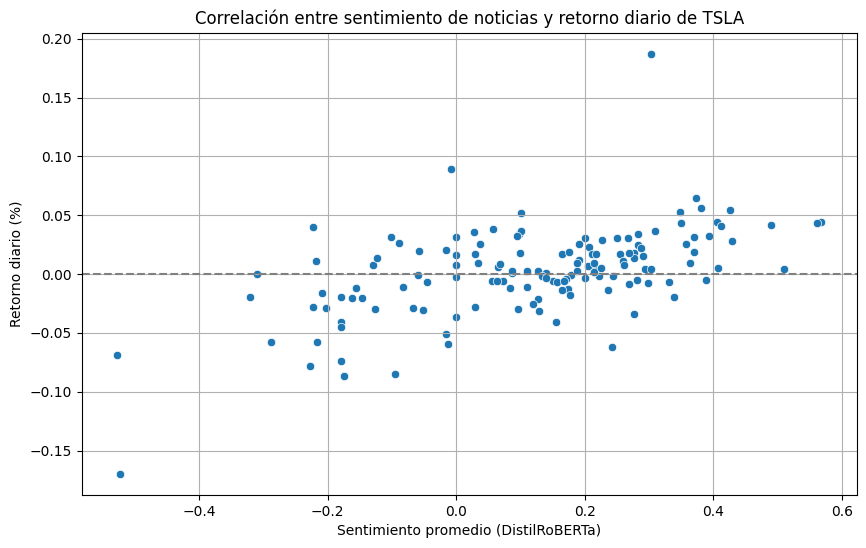

In [29]:
# 3. Gráfico de dispersión (scatter plot)
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_merged, x='sentiment_score', y='daily_return')
plt.title('Correlación entre sentimiento de noticias y retorno diario de TSLA')
plt.xlabel('Sentimiento promedio (DistilRoBERTa)')
plt.ylabel('Retorno diario (%)')
plt.axhline(0, color='gray', linestyle='--')
plt.grid(True)
plt.show()

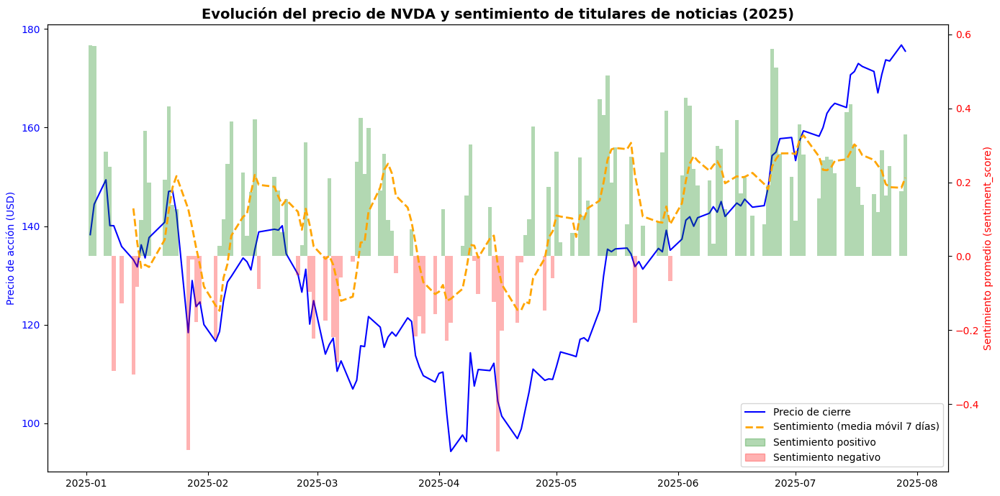

In [30]:
# 4. Gráfico combinado en el tiempo
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

# Copia del dataframe para no modificar el original
df_plot = df_merged.copy()

# Media móvil de 7 días para suavizar el sentimiento
df_plot['sentiment_rolling'] = df_plot['sentiment_score'].rolling(7).mean()

# Crear figura y ejes
fig, ax1 = plt.subplots(figsize=(14, 7))

# --- Eje 1: Precio de cierre ---
ax1.plot(df_plot['Date'], df_plot['Close'], color='blue', label='Precio de cierre')
ax1.set_ylabel('Precio de acción (USD)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# --- Eje 2: Sentimiento ---
ax2 = ax1.twinx()

# Dibujar el sentimiento diario con colores (verde si >0, rojo si <0)
colors = np.where(df_plot['sentiment_score'] >= 0, 'green', 'red')
ax2.bar(df_plot['Date'], df_plot['sentiment_score'],
        color=colors, alpha=0.3, width=1.0)

# Añadir línea suavizada (media móvil 7 días)
ax2.plot(df_plot['Date'], df_plot['sentiment_rolling'],
         color='orange', linestyle='--', linewidth=2, label='Sentimiento (media móvil 7 días)')

ax2.set_ylabel('Sentimiento promedio (sentiment_score)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# --- Leyenda manual para diferenciar positivo y negativo ---
pos_patch = mpatches.Patch(color='green', alpha=0.3, label='Sentimiento positivo')
neg_patch = mpatches.Patch(color='red', alpha=0.3, label='Sentimiento negativo')

# --- Título y estética ---
plt.title('Evolución del precio de NVDA y sentimiento de titulares de noticias (2025)', fontsize=14, fontweight='bold')
fig.tight_layout()

# Leyendas combinadas
lines_labels = [ax.get_legend_handles_labels() for ax in [ax1, ax2]]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
# Añadir parches personalizados
lines += [pos_patch, neg_patch]
labels += [pos_patch.get_label(), neg_patch.get_label()]

ax1.legend(lines, labels, loc='lower right')

plt.show()

In [31]:
# 5. Agrupación semanal para mostrar cómo evoluciona el sentimiento semanal frente al precio semanal

# Agrupar semanalmente promediando valores numéricos
df_weekly = df_merged.set_index('Date').resample('W').mean(numeric_only=True).reset_index()

# Calcular correlación semanal
correlacion_semanal = df_weekly[['sentiment_score', 'daily_return']].corr().iloc[0, 1]
print(f"📅 Correlación semanal entre sentimiento y retorno: {correlacion_semanal:.4f}")

📅 Correlación semanal entre sentimiento y retorno: 0.7861


In [32]:
# 6. Vamos a comprobar si el sentimiento de la semana anterior predice el retorno de la semana actual.
# Esto es muy útil para evaluar si el sentimiento anticipa movimientos de precio.
# Para ello aplicamos un desfase (lag).

# Crear una nueva columna con el sentimiento de la semana anterior
df_weekly['sentiment_lag1'] = df_weekly['sentiment_score'].shift(1)

# Calcular correlación entre sentimiento lag y retorno actual
correlacion_lag1 = df_weekly[['sentiment_lag1', 'daily_return']].corr().iloc[0, 1]
print(f"📊 Correlación con desfase 1 semana: {correlacion_lag1:.4f}")

📊 Correlación con desfase 1 semana: -0.2754


  Sentimiento  Días totales  Mov. esperado  % coincidencia
0    Positivo           101             67       66.336634
1    Negativo            36             27       75.000000


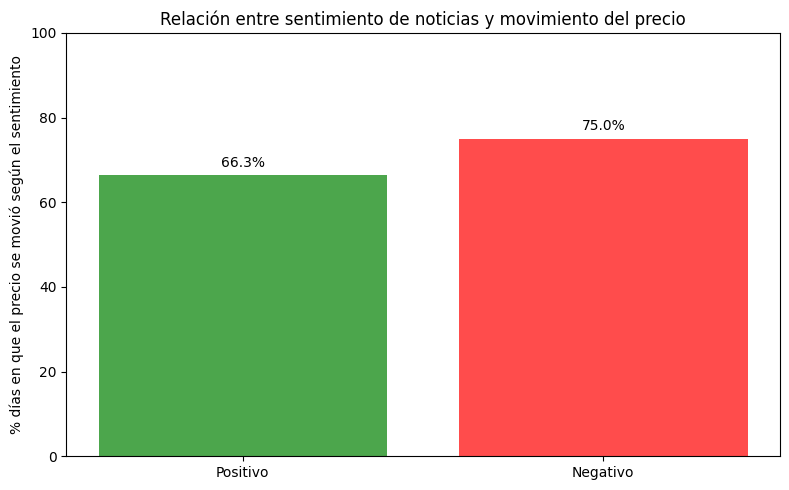

In [33]:
# 7. Análisis comparativo MISMO DÍA

import pandas as pd
import matplotlib.pyplot as plt

# Asegurarse de que el DataFrame esté ordenado por fecha
df_merged = df_merged.sort_values(by='Date')

# ────────────────
# Filtrar días por sentimiento y dirección del precio
# ────────────────
positivos = df_merged[df_merged['sentiment_score'] > 0]
negativos = df_merged[df_merged['sentiment_score'] < 0]

subidas_positivas = positivos[positivos['daily_return'] > 0]
bajadas_negativas = negativos[negativos['daily_return'] < 0]

# ────────────────
# Calcular porcentajes de coincidencia
# ────────────────
porcentaje_pos = len(subidas_positivas) / len(positivos) * 100 if len(positivos) > 0 else 0
porcentaje_neg = len(bajadas_negativas) / len(negativos) * 100 if len(negativos) > 0 else 0

# ────────────────
# Crear tabla de resultados
# ────────────────
tabla_resultados = pd.DataFrame({
    'Sentimiento': ['Positivo', 'Negativo'],
    'Días totales': [len(positivos), len(negativos)],
    'Mov. esperado': [len(subidas_positivas), len(bajadas_negativas)],
    '% coincidencia': [porcentaje_pos, porcentaje_neg]
})

print(tabla_resultados)

# ────────────────
# Gráfico de barras visual
# ────────────────
plt.figure(figsize=(8,5))
colores = ['green', 'red']
plt.bar(tabla_resultados['Sentimiento'], tabla_resultados['% coincidencia'], color=colores, alpha=0.7)
plt.ylabel('% días en que el precio se movió según el sentimiento')
plt.title('Relación entre sentimiento de noticias y movimiento del precio')
plt.ylim(0, 100)

# Añadir etiquetas de porcentaje encima de las barras
for i, val in enumerate(tabla_resultados['% coincidencia']):
    plt.text(i, val + 2, f"{val:.1f}%", ha='center', fontsize=10)

plt.tight_layout()
plt.show()

  Sentimiento  Días totales  Mov. esperado  % coincidencia
0    Positivo           101             58       57.425743
1    Negativo            36             17       47.222222


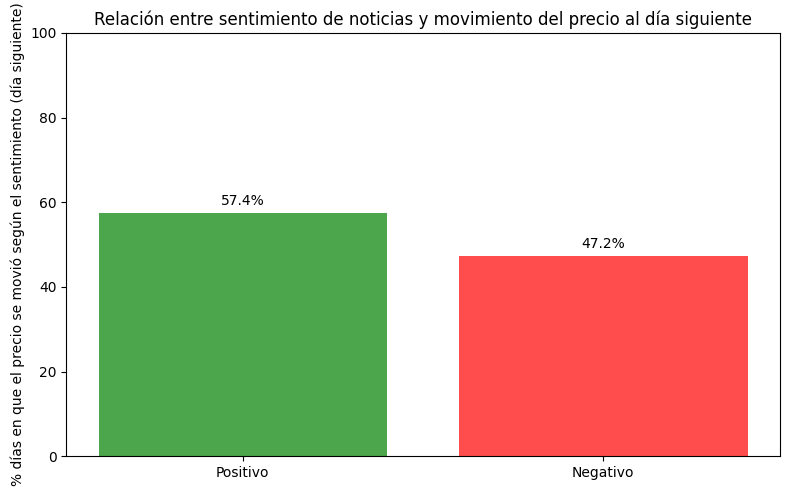

In [34]:
# 8. Análisis comparativo DÍA SIGUIENTE

import pandas as pd
import matplotlib.pyplot as plt

# Asegurarse de que el DataFrame esté ordenado por fecha
df_merged = df_merged.sort_values(by='Date')

# ────────────────
# Desfase de 1 día: el sentimiento de hoy frente al retorno de mañana
# ────────────────
df_merged['daily_return_next'] = df_merged['daily_return'].shift(-1)

# Filtrar días por sentimiento y dirección del precio al día siguiente
positivos = df_merged[df_merged['sentiment_score'] > 0]
negativos = df_merged[df_merged['sentiment_score'] < 0]

subidas_positivas = positivos[positivos['daily_return_next'] > 0]
bajadas_negativas = negativos[negativos['daily_return_next'] < 0]

# ────────────────
# Calcular porcentajes de coincidencia
# ────────────────
porcentaje_pos = len(subidas_positivas) / len(positivos) * 100 if len(positivos) > 0 else 0
porcentaje_neg = len(bajadas_negativas) / len(negativos) * 100 if len(negativos) > 0 else 0

# ────────────────
# Crear tabla de resultados
# ────────────────
tabla_resultados = pd.DataFrame({
    'Sentimiento': ['Positivo', 'Negativo'],
    'Días totales': [len(positivos), len(negativos)],
    'Mov. esperado': [len(subidas_positivas), len(bajadas_negativas)],
    '% coincidencia': [porcentaje_pos, porcentaje_neg]
})

print(tabla_resultados)

# ────────────────
# Gráfico de barras visual
# ────────────────
plt.figure(figsize=(8,5))
colores = ['green', 'red']
plt.bar(tabla_resultados['Sentimiento'], tabla_resultados['% coincidencia'], color=colores, alpha=0.7)
plt.ylabel('% días en que el precio se movió según el sentimiento (día siguiente)')
plt.title('Relación entre sentimiento de noticias y movimiento del precio al día siguiente')
plt.ylim(0, 100)

# Añadir etiquetas de porcentaje encima de las barras
for i, val in enumerate(tabla_resultados['% coincidencia']):
    plt.text(i, val + 2, f"{val:.1f}%", ha='center', fontsize=10)

plt.tight_layout()
plt.show()

    Sentimiento  Días totales  Mov. esperado  % coincidencia      Escenario
0  Muy positivo            55             43       78.181818      Mismo día
1  Muy negativo            12             10       83.333333      Mismo día
2  Muy positivo            55             35       63.636364  Día siguiente
3  Muy negativo            12              9       75.000000  Día siguiente


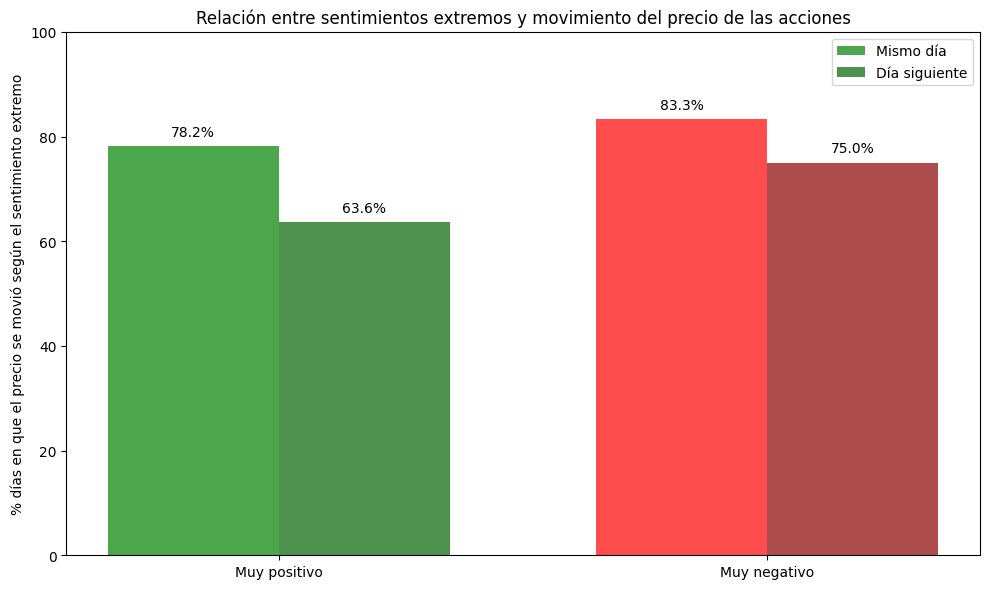

In [35]:
# 9. Análisis comparativo SENTIMIENTOS EXTREMOS (> 0.2 ó < -0.2)

import pandas as pd
import matplotlib.pyplot as plt

# Asegurarse de que el DataFrame esté ordenado por fecha
df_merged = df_merged.sort_values(by='Date')

# ────────────────
# Desfase de 1 día
# ────────────────
df_merged['daily_return_next'] = df_merged['daily_return'].shift(-1)

# ────────────────
# Función para calcular coincidencia según umbrales de sentimiento extremo
# ────────────────
def porcentaje_coincidencia_extremo(df, sentiment_col, return_col, umbral_pos=0.2, umbral_neg=-0.2):
    positivos = df[df[sentiment_col] > umbral_pos]
    negativos = df[df[sentiment_col] < umbral_neg]

    subidas_positivas = positivos[positivos[return_col] > 0]
    bajadas_negativas = negativos[negativos[return_col] < 0]

    porcentaje_pos = len(subidas_positivas) / len(positivos) * 100 if len(positivos) > 0 else 0
    porcentaje_neg = len(bajadas_negativas) / len(negativos) * 100 if len(negativos) > 0 else 0

    tabla = pd.DataFrame({
        'Sentimiento': ['Muy positivo', 'Muy negativo'],
        'Días totales': [len(positivos), len(negativos)],
        'Mov. esperado': [len(subidas_positivas), len(bajadas_negativas)],
        '% coincidencia': [porcentaje_pos, porcentaje_neg]
    })
    return tabla

# ────────────────
# 1. Coincidencia mismo día
# ────────────────
tabla_mismo_dia_extremo = porcentaje_coincidencia_extremo(df_merged, 'sentiment_score', 'daily_return')
tabla_mismo_dia_extremo['Escenario'] = 'Mismo día'

# ────────────────
# 2. Coincidencia día siguiente
# ────────────────
tabla_dia_siguiente_extremo = porcentaje_coincidencia_extremo(df_merged, 'sentiment_score', 'daily_return_next')
tabla_dia_siguiente_extremo['Escenario'] = 'Día siguiente'

# ────────────────
# Combinar tablas
# ────────────────
tabla_completa_extremo = pd.concat([tabla_mismo_dia_extremo, tabla_dia_siguiente_extremo], ignore_index=True)
print(tabla_completa_extremo)

# ────────────────
# Gráfico comparativo
# ────────────────
plt.figure(figsize=(10,6))

anchura = 0.35
x = range(len(tabla_mismo_dia_extremo))

# Barras mismo día
plt.bar([i - anchura/2 for i in x],
        tabla_mismo_dia_extremo['% coincidencia'],
        width=anchura,
        color=['green','red'],
        alpha=0.7,
        label='Mismo día')

# Barras día siguiente
plt.bar([i + anchura/2 for i in x],
        tabla_dia_siguiente_extremo['% coincidencia'],
        width=anchura,
        color=['darkgreen','darkred'],
        alpha=0.7,
        label='Día siguiente')

plt.xticks(ticks=x, labels=tabla_mismo_dia_extremo['Sentimiento'])
plt.ylabel('% días en que el precio se movió según el sentimiento extremo')
plt.title('Relación entre sentimientos extremos y movimiento del precio de las acciones')
plt.ylim(0, 100)
plt.legend()

# Añadir etiquetas de porcentaje encima de las barras
for i, val in enumerate(tabla_mismo_dia_extremo['% coincidencia']):
    plt.text(i - anchura/2, val + 2, f"{val:.1f}%", ha='center', fontsize=10)
for i, val in enumerate(tabla_dia_siguiente_extremo['% coincidencia']):
    plt.text(i + anchura/2, val + 2, f"{val:.1f}%", ha='center', fontsize=10)

plt.tight_layout()
plt.show()

## 2.	Tweets con carácter financiero por compañía y periodo específico vs Precio de acciones

In [41]:
# Cargo el dataset con los tweets recolectados sobre Tesla y periodo del 01-01-2022 a 01-10-2022
import pandas as pd

df = pd.read_excel('Tweets_Recolectados_Tesla.xlsx')

In [ ]:
# Analizamos el sentimiento con el modelo BERTweet, pero podríamos haber usado cualquier otro
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch
import torch.nn.functional as F
from tqdm import tqdm

# Modelo fine-tuned para análisis de sentimiento
MODEL_NAME = "finiteautomata/bertweet-base-sentiment-analysis" # Este modelo ya está afinado específicamente para clasificación de sentimiento en tweets
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME)

# Creamos una función para predecir sentimiento
def predict_sentiment(tweet: str) -> str:
    inputs = tokenizer(tweet, return_tensors="pt", truncation=True)
    with torch.no_grad():
        logits = model(**inputs).logits
        probs = F.softmax(logits, dim=1)
        label_id = torch.argmax(probs, dim=1).item()

    labels = model.config.id2label
    return labels[label_id]

# Lo aplico a mis tweets en formato original (sin preprocesado) porque el modelo de Hugging Face está entrenado para interpretar todo (emojis, menciones, etc.) como señales de sentimiento
tqdm.pandas() # Para mostrar una barra de progreso
# Convierto los valores a cadenas y reemplazo los NaN por texto vacío
df['Tweet'] = df['Tweet'].fillna('').astype(str)
# Creamos una nueva columna llamada bertweet_sentiment con etiquetas como NEG, NEU, POS llamando a la función anterior
df['bertweet_sentiment'] = df['Tweet'].progress_apply(predict_sentiment)

df.head()

In [ ]:
# Guardamos el resultado
df.to_excel("analisis_sentimiento_BERTweet.xlsx", index=False)

In [47]:
import pandas as pd

# Cargo el dataset con el análisis de sentimiento ya realizado (modelo BERTweet) aplicado a los tweets recolectados de Tesla
df = pd.read_excel('analisis_sentimiento_BERTweet.xlsx')

In [48]:
df.head()

,Date,Tweet,Stock Name,Company Name,bertweet_sentiment
0,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",NEG
1,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",NEU
2,2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",NEU
3,2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",NEG
4,2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",NEG


In [49]:
# Convertimos la columna "Date", que es de tipo objeto a tipo datetime
df['Date'] = pd.to_datetime(df['Date'])

# Crear nueva columna 'date' con solo la fecha (sin hora)
df['date'] = df['Date'].dt.date

# Convertimos la columna "date", que es de tipo objeto a tipo datetime
df['date'] = pd.to_datetime(df['date'])

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37422 entries, 0 to 37421
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   Date                37422 non-null  datetime64[ns, UTC]
 1   Tweet               37422 non-null  object             
 2   Stock Name          37422 non-null  object             
 3   Company Name        37422 non-null  object             
 4   bertweet_sentiment  37422 non-null  object             
 5   date                37422 non-null  datetime64[ns]     
dtypes: datetime64[ns, UTC](1), datetime64[ns](1), object(4)
memory usage: 1.7+ MB


In [50]:
df.head()

,Date,Tweet,Stock Name,Company Name,bertweet_sentiment,date
0,2022-09-29 23:41:16+00:00,Mainstream media has done an amazing job at br...,TSLA,"Tesla, Inc.",NEG,2022-09-29
1,2022-09-29 23:24:43+00:00,Tesla delivery estimates are at around 364k fr...,TSLA,"Tesla, Inc.",NEU,2022-09-29
2,2022-09-29 23:18:08+00:00,3/ Even if I include 63.0M unvested RSUs as of...,TSLA,"Tesla, Inc.",NEU,2022-09-29
3,2022-09-29 22:40:07+00:00,@RealDanODowd @WholeMarsBlog @Tesla Hahaha why...,TSLA,"Tesla, Inc.",NEG,2022-09-29
4,2022-09-29 22:27:05+00:00,"@RealDanODowd @Tesla Stop trying to kill kids,...",TSLA,"Tesla, Inc.",NEG,2022-09-29


In [51]:
# Asignamos un valor numérico al sentimiento
sentiment_map = {'POS': 1, 'NEU': 0, 'NEG': -1}
df['sentiment_score'] = df['bertweet_sentiment'].map(sentiment_map)

# Agrupamos por fecha (media diaria del sentimiento)
df_sentiment_daily = df.groupby('date')['sentiment_score'].mean().reset_index()

df_sentiment_daily.head()

,date,sentiment_score
0,2021-09-30,0.111111
1,2021-10-01,0.223404
2,2021-10-02,0.508621
3,2021-10-03,0.295082
4,2021-10-04,0.016807


In [52]:
df_sentiment_daily.shape

(365, 2)

In [53]:
df_merged.shape

(142, 11)

In [55]:
# JOIN: Unimos sentimiento con precios por fecha
df_merged = pd.merge(df_precio, df_sentiment_daily, left_on='Date', right_on='date', how='left')

# Rellenar días sin tweets con 0 (neutral)
df_merged['sentiment_score'] = df_merged['sentiment_score'].fillna(0)

# Crear la columna de retorno diario
df_merged['daily_return'] = df_merged['Close'].pct_change()
df_merged.head()

,Date,Open,High,Low,Close,Volume,date,sentiment_score,daily_return
0,2022-01-03,382.583344,400.356659,378.679993,399.926666,103931400,2022-01-03,0.302932,NaN
1,2022-01-04,396.516663,402.666656,374.350006,383.196655,100248300,2022-01-04,0.071429,-0.041833
2,2022-01-05,382.216675,390.113342,360.336670,362.706665,80119800,2022-01-05,0.032468,-0.053471
3,2022-01-06,359.000000,362.666656,340.166656,354.899994,90336600,2022-01-06,0.196581,-0.021523
4,2022-01-07,360.123322,360.309998,336.666656,342.320007,84164700,2022-01-07,0.103704,-0.035447


In [56]:
# 1. Correlación numérica
correlation = df_merged[['sentiment_score', 'daily_return']].corr()
print(correlation)

                 sentiment_score  daily_return
sentiment_score         1.000000      0.379762
daily_return            0.379762      1.000000


In [57]:
# 2. La correlación con desfase de 1 día es muy útil porque mide si el sentimiento de hoy tiene algún poder predictivo sobre el retorno de mañana.

# ───────────────────────────
# Crear columna con el retorno del día siguiente (desfase de 1 día)
# ───────────────────────────
df_merged['daily_return_lag1'] = df_merged['daily_return'].shift(-1)

# ───────────────────────────
# Calcular correlación de Pearson entre sentimiento actual y retorno del día siguiente
# ───────────────────────────
corr_lag1 = df_merged[['sentiment_score', 'daily_return_lag1']].corr().iloc[0,1]

print(f"Correlación (sentimiento_t vs. retorno_t+1): {corr_lag1:.4f}")

Correlación (sentimiento_t vs. retorno_t+1): -0.0927


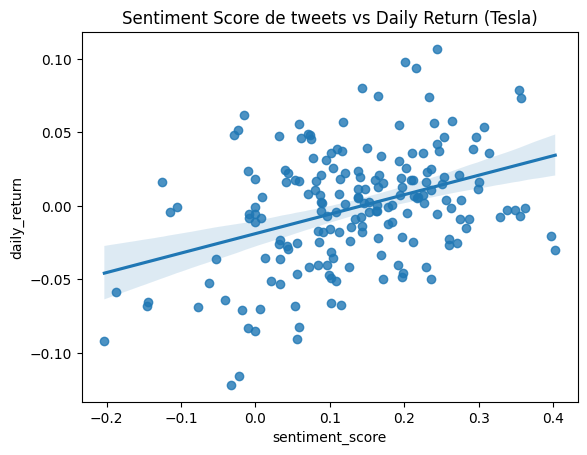

In [58]:
# 3. Diagrama de dispersión para ver la forma de la relación
import seaborn as sns
import matplotlib.pyplot as plt

sns.regplot(data=df_merged, x='sentiment_score', y='daily_return')
plt.title('Sentiment Score de tweets vs Daily Return (Tesla)')
plt.show()

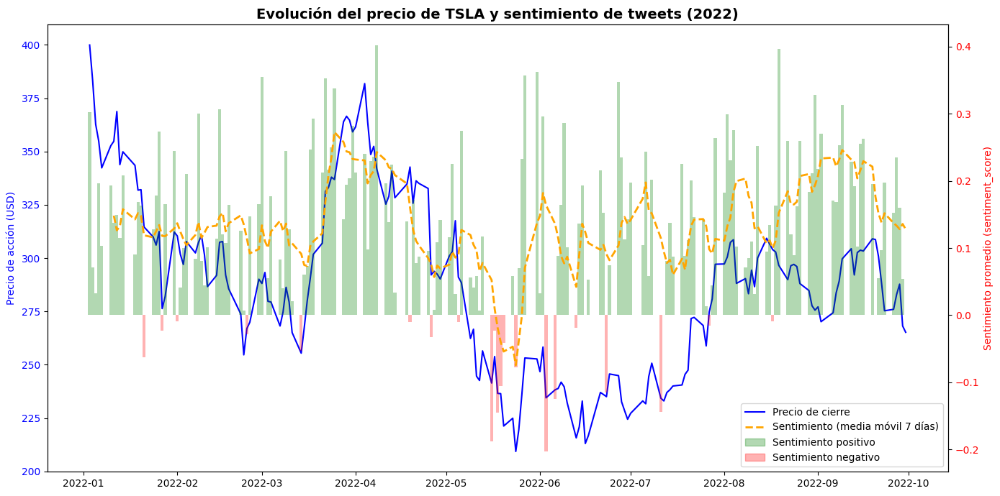

In [59]:
# 4. Gráfico combinado en el tiempo
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

# Copia del dataframe para no modificar el original
df_plot = df_merged.copy()

# Media móvil de 7 días para suavizar el sentimiento
df_plot['sentiment_rolling'] = df_plot['sentiment_score'].rolling(7).mean()

# Crear figura y ejes
fig, ax1 = plt.subplots(figsize=(14, 7))

# --- Eje 1: Precio de cierre ---
ax1.plot(df_plot['Date'], df_plot['Close'], color='blue', label='Precio de cierre')
ax1.set_ylabel('Precio de acción (USD)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# --- Eje 2: Sentimiento ---
ax2 = ax1.twinx()

# Dibujar el sentimiento diario con colores (verde si >0, rojo si <0)
colors = np.where(df_plot['sentiment_score'] >= 0, 'green', 'red')
ax2.bar(df_plot['Date'], df_plot['sentiment_score'],
        color=colors, alpha=0.3, width=1.0)

# Añadir línea suavizada (media móvil 7 días)
ax2.plot(df_plot['Date'], df_plot['sentiment_rolling'],
         color='orange', linestyle='--', linewidth=2, label='Sentimiento (media móvil 7 días)')

ax2.set_ylabel('Sentimiento promedio (sentiment_score)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# --- Leyenda manual para diferenciar positivo y negativo ---
pos_patch = mpatches.Patch(color='green', alpha=0.3, label='Sentimiento positivo')
neg_patch = mpatches.Patch(color='red', alpha=0.3, label='Sentimiento negativo')

# --- Título y estética ---
plt.title('Evolución del precio de TSLA y sentimiento de tweets (2022)', fontsize=14, fontweight='bold')
fig.tight_layout()

# Leyendas combinadas
lines_labels = [ax.get_legend_handles_labels() for ax in [ax1, ax2]]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
# Añadir parches personalizados
lines += [pos_patch, neg_patch]
labels += [pos_patch.get_label(), neg_patch.get_label()]

ax1.legend(lines, labels, loc='lower right')

plt.show()

In [60]:
# 5. Agrupación semanal para mostrar cómo evoluciona el sentimiento semanal frente al precio semanal

# Agrupar semanalmente promediando valores numéricos
df_weekly = df_merged.set_index('Date').resample('W').mean(numeric_only=True).reset_index()

# Calcular correlación semanal
correlacion_semanal = df_weekly[['sentiment_score', 'daily_return']].corr().iloc[0, 1]
print(f"📅 Correlación semanal entre sentimiento y retorno: {correlacion_semanal:.4f}")

📅 Correlación semanal entre sentimiento y retorno: 0.3059


In [61]:
# 6. Vamos a comprobar si el sentimiento de la semana anterior predice el retorno de la semana actual.
# Esto es muy útil para evaluar si el sentimiento anticipa movimientos de precio.
# Para ello aplicamos un desfase (lag).

# Crear una nueva columna con el sentimiento de la semana anterior
df_weekly['sentiment_lag1'] = df_weekly['sentiment_score'].shift(1)

# Calcular correlación entre sentimiento lag y retorno actual
correlacion_lag1 = df_weekly[['sentiment_lag1', 'daily_return']].corr().iloc[0, 1]
print(f"📊 Correlación con desfase 1 semana: {correlacion_lag1:.4f}")

📊 Correlación con desfase 1 semana: -0.0784


  Sentimiento  Días totales  Mov. esperado  % coincidencia      Escenario
0    Positivo           162             89       54.938272      Mismo día
1    Negativo            21             16       76.190476      Mismo día
2    Positivo           162             81       50.000000  Día siguiente
3    Negativo            21              9       42.857143  Día siguiente


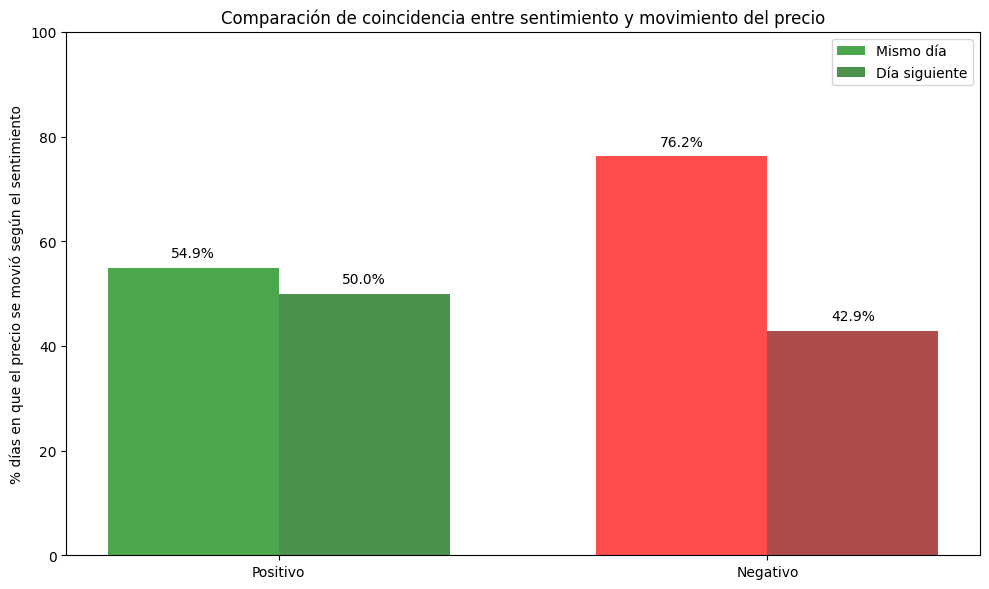

In [62]:
# 7. Análisis comparativo MISMO DÍA y DÍA SIGUIENTE

import pandas as pd
import matplotlib.pyplot as plt

# Asegurarse de que el DataFrame esté ordenado por fecha
df_merged = df_merged.sort_values(by='Date')

# ────────────────
# Desfase de 1 día
# ────────────────
df_merged['daily_return_next'] = df_merged['daily_return'].shift(-1)

# ────────────────
# Función para calcular porcentaje de coincidencia
# ────────────────
def porcentaje_coincidencia(df, sentiment_col, return_col):
    positivos = df[df[sentiment_col] > 0]
    negativos = df[df[sentiment_col] < 0]

    subidas_positivas = positivos[positivos[return_col] > 0]
    bajadas_negativas = negativos[negativos[return_col] < 0]

    porcentaje_pos = len(subidas_positivas) / len(positivos) * 100 if len(positivos) > 0 else 0
    porcentaje_neg = len(bajadas_negativas) / len(negativos) * 100 if len(negativos) > 0 else 0

    tabla = pd.DataFrame({
        'Sentimiento': ['Positivo', 'Negativo'],
        'Días totales': [len(positivos), len(negativos)],
        'Mov. esperado': [len(subidas_positivas), len(bajadas_negativas)],
        '% coincidencia': [porcentaje_pos, porcentaje_neg]
    })
    return tabla

# ────────────────
# 1. Coincidencia mismo día
# ────────────────
tabla_mismo_dia = porcentaje_coincidencia(df_merged, 'sentiment_score', 'daily_return')
tabla_mismo_dia['Escenario'] = 'Mismo día'

# ────────────────
# 2. Coincidencia día siguiente
# ────────────────
tabla_dia_siguiente = porcentaje_coincidencia(df_merged, 'sentiment_score', 'daily_return_next')
tabla_dia_siguiente['Escenario'] = 'Día siguiente'

# ────────────────
# Combinar tablas
# ────────────────
tabla_completa = pd.concat([tabla_mismo_dia, tabla_dia_siguiente], ignore_index=True)
print(tabla_completa)

# ────────────────
# Gráfico comparativo
# ────────────────
plt.figure(figsize=(10,6))

anchura = 0.35
x = range(len(tabla_mismo_dia))

# Barras mismo día
plt.bar([i - anchura/2 for i in x],
        tabla_mismo_dia['% coincidencia'],
        width=anchura,
        color=['green','red'],
        alpha=0.7,
        label='Mismo día')

# Barras día siguiente
plt.bar([i + anchura/2 for i in x],
        tabla_dia_siguiente['% coincidencia'],
        width=anchura,
        color=['darkgreen','darkred'],
        alpha=0.7,
        label='Día siguiente')

plt.xticks(ticks=x, labels=tabla_mismo_dia['Sentimiento'])
plt.ylabel('% días en que el precio se movió según el sentimiento')
plt.title('Comparación de coincidencia entre sentimiento y movimiento del precio')
plt.ylim(0, 100)
plt.legend()

# Añadir etiquetas de porcentaje encima de las barras
for i, val in enumerate(tabla_mismo_dia['% coincidencia']):
    plt.text(i - anchura/2, val + 2, f"{val:.1f}%", ha='center', fontsize=10)
for i, val in enumerate(tabla_dia_siguiente['% coincidencia']):
    plt.text(i + anchura/2, val + 2, f"{val:.1f}%", ha='center', fontsize=10)

plt.tight_layout()
plt.show()

    Sentimiento  Días totales  Mov. esperado  % coincidencia      Escenario
0  Muy positivo            56             36       64.285714      Mismo día
1  Muy negativo             1              1      100.000000      Mismo día
2  Muy positivo            56             28       50.000000  Día siguiente
3  Muy negativo             1              0        0.000000  Día siguiente


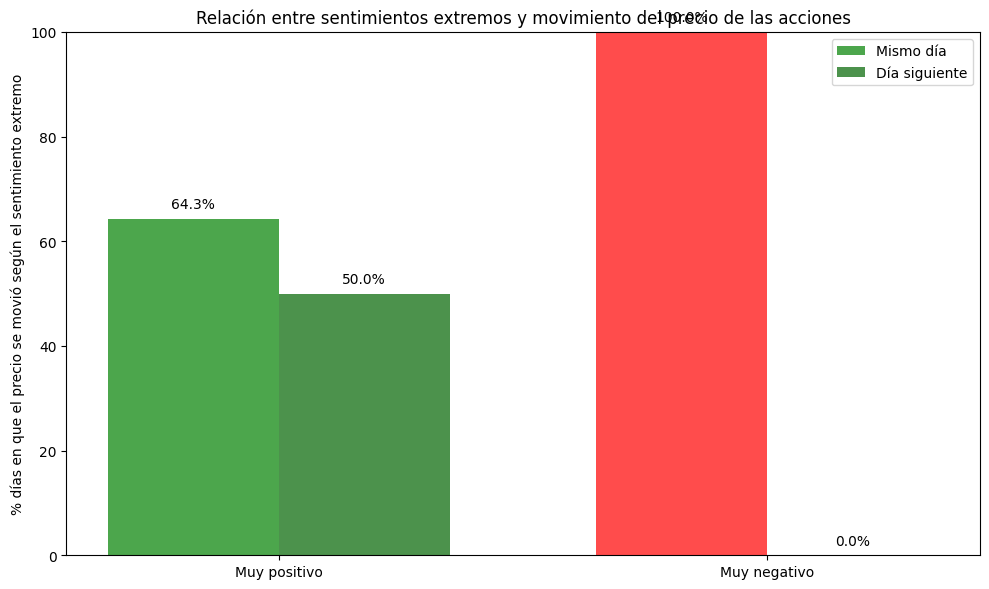

In [63]:
# 8. Análisis comparativo SENTIMIENTO EXTREMO

import pandas as pd
import matplotlib.pyplot as plt

# Asegurarse de que el DataFrame esté ordenado por fecha
df_merged = df_merged.sort_values(by='Date')

# ────────────────
# Desfase de 1 día
# ────────────────
df_merged['daily_return_next'] = df_merged['daily_return'].shift(-1)

# ────────────────
# Función para calcular coincidencia según umbrales de sentimiento extremo
# ────────────────
def porcentaje_coincidencia_extremo(df, sentiment_col, return_col, umbral_pos=0.2, umbral_neg=-0.2):
    positivos = df[df[sentiment_col] > umbral_pos]
    negativos = df[df[sentiment_col] < umbral_neg]

    subidas_positivas = positivos[positivos[return_col] > 0]
    bajadas_negativas = negativos[negativos[return_col] < 0]

    porcentaje_pos = len(subidas_positivas) / len(positivos) * 100 if len(positivos) > 0 else 0
    porcentaje_neg = len(bajadas_negativas) / len(negativos) * 100 if len(negativos) > 0 else 0

    tabla = pd.DataFrame({
        'Sentimiento': ['Muy positivo', 'Muy negativo'],
        'Días totales': [len(positivos), len(negativos)],
        'Mov. esperado': [len(subidas_positivas), len(bajadas_negativas)],
        '% coincidencia': [porcentaje_pos, porcentaje_neg]
    })
    return tabla

# ────────────────
# 1. Coincidencia mismo día
# ────────────────
tabla_mismo_dia_extremo = porcentaje_coincidencia_extremo(df_merged, 'sentiment_score', 'daily_return')
tabla_mismo_dia_extremo['Escenario'] = 'Mismo día'

# ────────────────
# 2. Coincidencia día siguiente
# ────────────────
tabla_dia_siguiente_extremo = porcentaje_coincidencia_extremo(df_merged, 'sentiment_score', 'daily_return_next')
tabla_dia_siguiente_extremo['Escenario'] = 'Día siguiente'

# ────────────────
# Combinar tablas
# ────────────────
tabla_completa_extremo = pd.concat([tabla_mismo_dia_extremo, tabla_dia_siguiente_extremo], ignore_index=True)
print(tabla_completa_extremo)

# ────────────────
# Gráfico comparativo
# ────────────────
plt.figure(figsize=(10,6))

anchura = 0.35
x = range(len(tabla_mismo_dia_extremo))

# Barras mismo día
plt.bar([i - anchura/2 for i in x],
        tabla_mismo_dia_extremo['% coincidencia'],
        width=anchura,
        color=['green','red'],
        alpha=0.7,
        label='Mismo día')

# Barras día siguiente
plt.bar([i + anchura/2 for i in x],
        tabla_dia_siguiente_extremo['% coincidencia'],
        width=anchura,
        color=['darkgreen','darkred'],
        alpha=0.7,
        label='Día siguiente')

plt.xticks(ticks=x, labels=tabla_mismo_dia_extremo['Sentimiento'])
plt.ylabel('% días en que el precio se movió según el sentimiento extremo')
plt.title('Relación entre sentimientos extremos y movimiento del precio de las acciones')
plt.ylim(0, 100)
plt.legend()

# Añadir etiquetas de porcentaje encima de las barras
for i, val in enumerate(tabla_mismo_dia_extremo['% coincidencia']):
    plt.text(i - anchura/2, val + 2, f"{val:.1f}%", ha='center', fontsize=10)
for i, val in enumerate(tabla_dia_siguiente_extremo['% coincidencia']):
    plt.text(i + anchura/2, val + 2, f"{val:.1f}%", ha='center', fontsize=10)

plt.tight_layout()
plt.show()

## 3.	Tweets por usuario específico vs Precio de acciones

**Elon Musk Tweets 2010 to 2025**

URL: https://www.kaggle.com/datasets/dadalyndell/elon-musk-tweets-2010-to-2025-march?select=all_musk_posts.csv

In [64]:
import pandas as pd

# Cargo el dataset con los tweets de Elon Musk entre el periodo de 2010 a 04/2025
df_tweets_ElonMusk = pd.read_csv('all_musk_posts.csv')

/tmp/ipython-input-332134827.py:4: DtypeWarning:

Columns (11,16,17,18,19) have mixed types. Specify dtype option on import or set low_memory=False.



In [65]:
df_tweets_ElonMusk.head()

,id,url,twitterUrl,fullText,retweetCount,replyCount,likeCount,quoteCount,viewCount,createdAt,...,inReplyToUserId,inReplyToUsername,isPinned,isRetweet,isQuote,isConversationControlled,possiblySensitive,quoteId,quote,retweet
0,1655159652990976000,https://x.com/elonmusk/status/1655159652990976000,https://twitter.com/elonmusk/status/1655159652...,RT @einarvollset: I read @paulg’s “How to Mak...,NaN,NaN,NaN,NaN,NaN,2023-05-07 10:36:27+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1657261624867299339,https://x.com/elonmusk/status/1657261624867299339,https://twitter.com/elonmusk/status/1657261624...,https://t.co/Zjn6r15lrR,NaN,NaN,NaN,NaN,NaN,2023-05-13 05:48:56+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1623774484795920384,https://x.com/elonmusk/status/1623774484795920384,https://twitter.com/elonmusk/status/1623774484...,RT @BillyM2k: dude bookmarks are an awesome tw...,NaN,NaN,NaN,NaN,NaN,2023-02-09 20:03:00+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1656900119202254854,https://x.com/elonmusk/status/1656900119202254854,https://twitter.com/elonmusk/status/1656900119...,Event Horizon Balance Beam,NaN,NaN,NaN,NaN,NaN,2023-05-12 05:52:26+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1616531874763116544,https://x.com/elonmusk/status/1616531874763116544,https://twitter.com/elonmusk/status/1616531874...,RT @BillyM2k: @elonmusk oh that’s actually pre...,NaN,NaN,NaN,NaN,NaN,2023-01-20 20:23:27+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [66]:
df_tweets_ElonMusk.shape

(55099, 24)

In [67]:
df_tweets_ElonMusk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55099 entries, 0 to 55098
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        55099 non-null  int64  
 1   url                       55099 non-null  object 
 2   twitterUrl                55099 non-null  object 
 3   fullText                  55099 non-null  object 
 4   retweetCount              55009 non-null  float64
 5   replyCount                54297 non-null  float64
 6   likeCount                 55009 non-null  float64
 7   quoteCount                54271 non-null  float64
 8   viewCount                 34455 non-null  float64
 9   createdAt                 55099 non-null  object 
 10  bookmarkCount             54271 non-null  float64
 11  isReply                   54271 non-null  object 
 12  inReplyToId               39497 non-null  float64
 13  conversationId            54297 non-null  float64
 14  inRepl

In [68]:
################################################################################
#                Búsqueda de nulos por columnas del Dataframe                  #
################################################################################

# Para poder encontrar el total de valores nulos haremos un tratamiento por columnas y, sumando dicho valor, obtendremos el total de nulos en cada columna
nulosPorColumna = df_tweets_ElonMusk.isnull().sum()

#Mostramos el resultado en una tabla
print("Número de valores nulos por columna:\n" + str(nulosPorColumna))

Número de valores nulos por columna:
id                              0
url                             0
twitterUrl                      0
fullText                        0
retweetCount                   90
replyCount                    802
likeCount                      90
quoteCount                    828
viewCount                   20644
createdAt                       0
bookmarkCount                 828
isReply                       828
inReplyToId                 15602
conversationId                802
inReplyToUserId             15578
inReplyToUsername           15578
isPinned                      828
isRetweet                      90
isQuote                       116
isConversationControlled      828
possiblySensitive           50178
quoteId                     47558
quote                       47826
retweet                     54007
dtype: int64


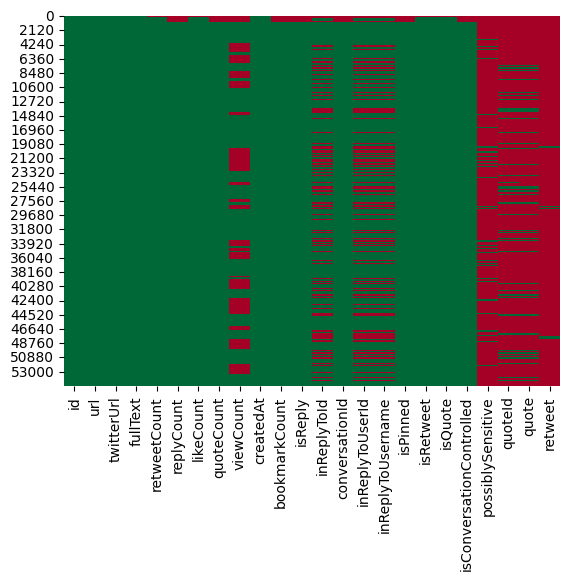

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualizamos los valores nulos con Heatmap para una representación gráfica de los valores nulos
# Elegimos el color verde para representar que las columnas contienen un valor y en color rojo la representación de los valores nulos
sns.heatmap(df_tweets_ElonMusk.isnull(), cbar=False, cmap='RdYlGn_r')
plt.show()

In [70]:
""" Para calcular el engagement_score, la mejor práctica es asumir que los valores nulos son ceros,
porque si no hay datos de interacción es probable que no haya habido interacciones o no se registraron. """
# Relleno con ceros
cols_to_fill = ['retweetCount', 'replyCount', 'likeCount', 'quoteCount', 'viewCount', 'bookmarkCount']
df_tweets_ElonMusk[cols_to_fill] = df_tweets_ElonMusk[cols_to_fill].fillna(0)

nulosPorColumna = df_tweets_ElonMusk.isnull().sum()
print("Número de valores nulos por columna:\n" + str(nulosPorColumna))

Número de valores nulos por columna:
id                              0
url                             0
twitterUrl                      0
fullText                        0
retweetCount                    0
replyCount                      0
likeCount                       0
quoteCount                      0
viewCount                       0
createdAt                       0
bookmarkCount                   0
isReply                       828
inReplyToId                 15602
conversationId                802
inReplyToUserId             15578
inReplyToUsername           15578
isPinned                      828
isRetweet                      90
isQuote                       116
isConversationControlled      828
possiblySensitive           50178
quoteId                     47558
quote                       47826
retweet                     54007
dtype: int64


In [71]:
# Calculamos el engagement de cada tweet

def calcula_engagement_score(row):
    # Filtro los tweets originales creados por Elon Musk (no me interesan los que él retuitea)
    if row['isRetweet']:
        return 0

    return round(
        2 * row['retweetCount'] +
        1.5 * row['replyCount'] +
        1.2 * row['likeCount'] +
        0.001 * row['viewCount'],
        2
    )

# Aplica la función a cada fila del DataFrame
df_tweets_ElonMusk['engagement_score'] = df_tweets_ElonMusk.apply(calcula_engagement_score, axis=1)

df_tweets_ElonMusk.head()

,id,url,twitterUrl,fullText,retweetCount,replyCount,likeCount,quoteCount,viewCount,createdAt,...,inReplyToUsername,isPinned,isRetweet,isQuote,isConversationControlled,possiblySensitive,quoteId,quote,retweet,engagement_score
0,1655159652990976000,https://x.com/elonmusk/status/1655159652990976000,https://twitter.com/elonmusk/status/1655159652...,RT @einarvollset: I read @paulg’s “How to Mak...,0.0,0.0,0.0,0.0,0.0,2023-05-07 10:36:27+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,1657261624867299339,https://x.com/elonmusk/status/1657261624867299339,https://twitter.com/elonmusk/status/1657261624...,https://t.co/Zjn6r15lrR,0.0,0.0,0.0,0.0,0.0,2023-05-13 05:48:56+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2,1623774484795920384,https://x.com/elonmusk/status/1623774484795920384,https://twitter.com/elonmusk/status/1623774484...,RT @BillyM2k: dude bookmarks are an awesome tw...,0.0,0.0,0.0,0.0,0.0,2023-02-09 20:03:00+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
3,1656900119202254854,https://x.com/elonmusk/status/1656900119202254854,https://twitter.com/elonmusk/status/1656900119...,Event Horizon Balance Beam,0.0,0.0,0.0,0.0,0.0,2023-05-12 05:52:26+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
4,1616531874763116544,https://x.com/elonmusk/status/1616531874763116544,https://twitter.com/elonmusk/status/1616531874...,RT @BillyM2k: @elonmusk oh that’s actually pre...,0.0,0.0,0.0,0.0,0.0,2023-01-20 20:23:27+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [72]:
# Filtro los tweets más influyentes
# Por ejemplo, ordeno por engagement_score de mayor a menor
df_tweets_ElonMusk_ordenado = df_tweets_ElonMusk.sort_values(by='engagement_score', ascending=False)

# Muestro los 10 tweets con más engagement
df_tweets_ElonMusk_ordenado[['createdAt', 'fullText', 'engagement_score']].head(10)

,createdAt,fullText,engagement_score
43578,2022-04-28 00:56:58+00:00,Next I’m buying Coca-Cola to put the cocaine b...,6729968.10
43594,2022-04-25 16:12:30+00:00,I hope that even my worst critics remain on Tw...,4467731.20
51494,2024-11-06 05:01:15+00:00,🇺🇸🇺🇸The future is gonna be so 🔥 🇺🇸🇺🇸 https://t...,3880028.69
16977,2024-07-13 22:45:13+00:00,I fully endorse President Trump and hope for h...,3866088.79
42199,2022-04-25 19:43:22+00:00,🚀💫♥️ Yesss!!! ♥️💫🚀 https://t.co/0T9HzUHuh6,3694660.70
51472,2024-11-06 16:39:24+00:00,It is morning in America again https://t.co/GN...,3551202.80
40377,2022-10-28 03:49:11+00:00,the bird is freed,3530052.60
43575,2022-04-28 01:53:50+00:00,Let’s make Twitter maximum fun!,3416516.80
51488,2024-11-06 05:35:11+00:00,Let that sink in https://t.co/XvYFtDrhRm,3415017.56
43574,2022-04-28 01:57:27+00:00,"Listen, I can’t do miracles ok https://t.co/z7...",3310231.20


In [73]:
# Filtramos por palabras clave por empresa/activo para buscar patrones con el movimiento del precio de acciones
keywords_tsla = ['tesla', 'tsla']
keywords_btc = ['bitcoin', 'btc']
keywords_doge = ['doge', 'dogecoin']

# Busca menciones relacionadas
tsla_tweets = df_tweets_ElonMusk_ordenado[df_tweets_ElonMusk_ordenado['fullText'].str.lower().str.contains('|'.join(keywords_tsla))]
btc_tweets = df_tweets_ElonMusk_ordenado[df_tweets_ElonMusk_ordenado['fullText'].str.lower().str.contains('|'.join(keywords_btc))]
doge_tweets = df_tweets_ElonMusk_ordenado[df_tweets_ElonMusk_ordenado['fullText'].str.lower().str.contains('|'.join(keywords_doge))]

In [74]:
doge_tweets[['engagement_score', 'fullText', 'createdAt']].head()

,engagement_score,fullText,createdAt
31753,1145295.58,The @DOGE team just discovered that FEMA sent ...,2025-02-10 10:03:25+00:00
30835,1060573.00,Doges ftw https://t.co/bl0trQ7BdU,2023-07-19 15:45:05+00:00
48881,1035616.90,🎶 Who let the Doge out 🎶,2021-02-07 22:25:14+00:00
14363,1009739.80,"No highs, no lows, only Doge",2021-02-04 08:27:10+00:00
13522,887134.35,He’s mad that @DOGE is dismantling the radical...,2025-02-04 18:12:53+00:00


In [75]:
doge_tweets.shape

(1651, 25)

In [76]:
# Convertimos la columna "createdAt", que es de tipo objeto a tipo datetime
doge_tweets['createdAt'] = pd.to_datetime(doge_tweets['createdAt'])

# Crear nueva columna 'date' con solo la fecha (sin hora)
doge_tweets['date'] = doge_tweets['createdAt'].dt.date

# Convertimos la columna "date", que es de tipo objeto a tipo datetime
doge_tweets['date'] = pd.to_datetime(doge_tweets['date'])

doge_tweets.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1651 entries, 31753 to 19414
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype              
---  ------                    --------------  -----              
 0   id                        1651 non-null   int64              
 1   url                       1651 non-null   object             
 2   twitterUrl                1651 non-null   object             
 3   fullText                  1651 non-null   object             
 4   retweetCount              1651 non-null   float64            
 5   replyCount                1651 non-null   float64            
 6   likeCount                 1651 non-null   float64            
 7   quoteCount                1651 non-null   float64            
 8   viewCount                 1651 non-null   float64            
 9   createdAt                 1651 non-null   datetime64[ns, UTC]
 10  bookmarkCount             1651 non-null   float64            
 11  isReply          

/tmp/ipython-input-3817827870.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-3817827870.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-3817827870.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [77]:
# Agrupamos los engagement_score por fecha (por si hay varios tweets el mismo día) y se acumula el engagement_score diario
df_engagement_daily = doge_tweets.groupby('date')['engagement_score'].sum().reset_index()

df_engagement_daily.head(10)

,date,engagement_score
0,2017-09-14,1.2
1,2019-04-02,241410.0
2,2020-04-25,3445.0
3,2020-07-18,18709.3
4,2020-11-17,1948.6
5,2020-12-20,299684.0
6,2021-02-04,2135587.5
7,2021-02-06,12493.2
8,2021-02-07,1113250.4
9,2021-02-08,23282.3


In [78]:
df_engagement_daily.shape

(728, 2)

In [79]:
df_merged.shape

(188, 11)

In [85]:
# JOIN: Unimos engagement con precios por fecha
df_merged = pd.merge(df_precio, df_engagement_daily, left_on='Date', right_on='date', how='left')

# Rellenar días sin tweets publicados por ElonMusk relacionados con DOGE con 0 (engagement nulo)
df_merged['engagement_score'] = df_merged['engagement_score'].fillna(0)

# Crear la columna de retorno diario
df_merged['daily_return'] = df_merged['Close'].pct_change()
df_merged.head()

,Date,Open,High,Low,Close,Volume,date,engagement_score,daily_return
0,2020-12-01,0.003551,0.003572,0.003269,0.003335,80163603,NaT,0.0,NaN
1,2020-12-02,0.003335,0.003436,0.003293,0.003374,58705661,NaT,0.0,0.011694
2,2020-12-03,0.003375,0.003500,0.003352,0.003428,47907032,NaT,0.0,0.016005
3,2020-12-04,0.003429,0.003447,0.003285,0.003298,45062222,NaT,0.0,-0.037923
4,2020-12-05,0.003297,0.003414,0.003268,0.003397,43386583,NaT,0.0,0.030018


In [86]:
# 1. Correlación numérica
correlation = df_merged[['engagement_score', 'daily_return']].corr()
print(correlation)

                  engagement_score  daily_return
engagement_score          1.000000      0.048111
daily_return              0.048111      1.000000


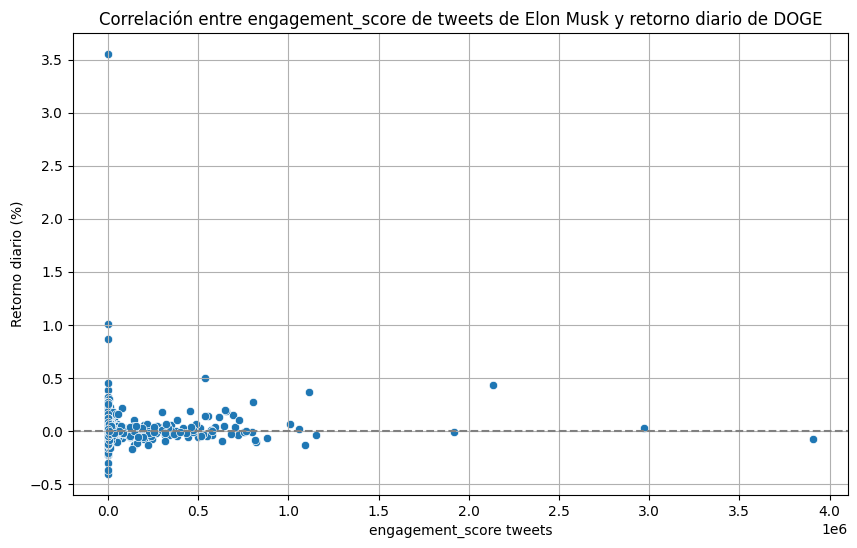

In [87]:
# 2. Gráfico de dispersión (scatter plot)
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_merged, x='engagement_score', y='daily_return')
plt.title('Correlación entre engagement_score de tweets de Elon Musk y retorno diario de DOGE')
plt.xlabel('engagement_score tweets')
plt.ylabel('Retorno diario (%)')
plt.axhline(0, color='gray', linestyle='--')
plt.grid(True)
plt.show()

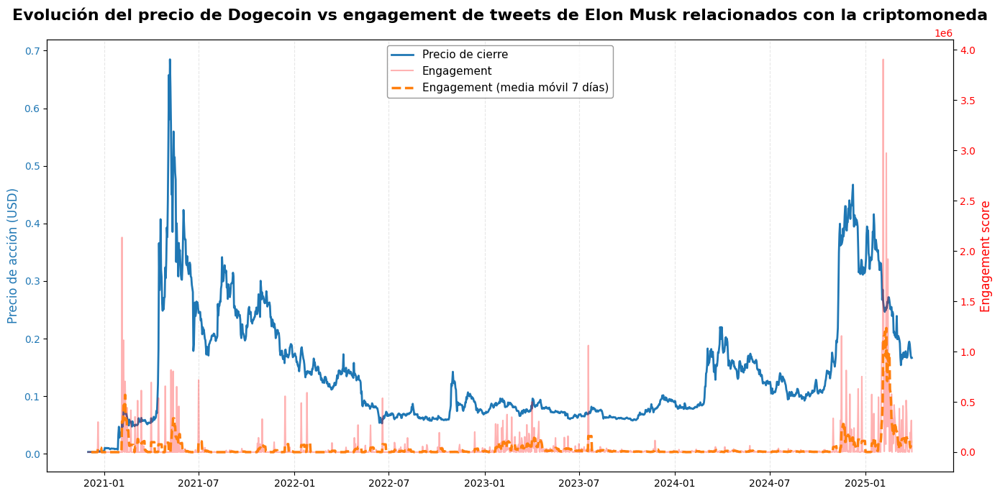

In [88]:
# 3. Gráfico combinado en el tiempo
import matplotlib.pyplot as plt
import numpy as np

# Copia del dataframe para no modificar el original
df_plot = df_merged.copy()

# Media móvil de 7 días para suavizar el engagement
df_plot['engagement_rolling'] = df_plot['engagement_score'].rolling(7).mean()

# Crear figura y ejes
fig, ax1 = plt.subplots(figsize=(14, 7))

# --- Eje 1: Precio de cierre ---
ax1.plot(df_plot['Date'], df_plot['Close'], color='#1f77b4', linewidth=2, label='Precio de cierre')
ax1.set_ylabel('Precio de acción (USD)', color='#1f77b4', fontsize=12)
ax1.tick_params(axis='y', labelcolor='#1f77b4')
ax1.grid(axis='x', linestyle='--', alpha=0.3)

# --- Eje 2: Engagement ---
ax2 = ax1.twinx()

# Línea de engagement diario más visible
ax2.plot(df_plot['Date'], df_plot['engagement_score'],
         color='red', linewidth=1.5, alpha=0.3, label='Engagement')

# Línea de media móvil discontinua
ax2.plot(df_plot['Date'], df_plot['engagement_rolling'],
         color='#ff7f0e', linestyle='--', linewidth=2.5, label='Engagement (media móvil 7 días)')

ax2.set_ylabel('Engagement score', color='red', fontsize=12)
ax2.tick_params(axis='y', labelcolor='red')

# --- Título y estética ---
plt.title('Evolución del precio de Dogecoin vs engagement de tweets de Elon Musk relacionados con la criptomoneda',
          fontsize=16, fontweight='bold', pad=20)

fig.tight_layout()

# Leyendas combinadas
lines_labels = [ax.get_legend_handles_labels() for ax in [ax1, ax2]]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
ax1.legend(lines, labels, loc='upper center', frameon=True, fontsize=11, facecolor='white', edgecolor='gray')

plt.show()

In [89]:
# 4. Agrupación semanal para mostrar cómo evoluciona el engagement semanal frente al precio semanal

# Agrupar semanalmente promediando valores numéricos
df_weekly = df_merged.set_index('Date').resample('W').mean(numeric_only=True).reset_index()

# Calcular correlación semanal
correlacion_semanal = df_weekly[['engagement_score', 'daily_return']].corr().iloc[0, 1]
print(f"📅 Correlación semanal entre engagement y retorno: {correlacion_semanal:.4f}")

📅 Correlación semanal entre engagement y retorno: 0.0317


In [90]:
# 5. Vamos a comprobar si el engagement de la semana anterior predice el retorno de la semana actual.
# Esto es muy útil para evaluar si el engagement anticipa movimientos de precio.
# Para ello aplicamos un desfase (lag).

# Crear una nueva columna con el engagement de la semana anterior
df_weekly['engagement_lag1'] = df_weekly['engagement_score'].shift(1)

# Calcular correlación entre engagement lag y retorno actual
correlacion_lag1 = df_weekly[['engagement_lag1', 'daily_return']].corr().iloc[0, 1]
print(f"📊 Correlación con desfase 1 semana: {correlacion_lag1:.4f}")

📊 Correlación con desfase 1 semana: -0.0728


In [91]:
# 6. Calcular variación de precio (día siguiente)
df_merged['next_day_price'] = df_merged['Close'].shift(-1)
df_merged['price_change'] = df_merged['next_day_price'] - df_merged['Close']

# Correlación
corr = df_merged[['engagement_score', 'price_change']].corr()
print(corr)

                  engagement_score  price_change
engagement_score          1.000000     -0.053245
price_change             -0.053245      1.000000


In [92]:
# 7. Calcular variación de precio a 2 días después
df_merged['price_change_2d'] = df_merged['Close'].shift(-2) - df_merged['Close']
print(df_merged[['engagement_score', 'price_change_2d']].corr())

                  engagement_score  price_change_2d
engagement_score          1.000000        -0.042418
price_change_2d          -0.042418         1.000000


In [93]:
# 8. A veces, tweets con mucho engagement aumentan la volatilidad, no necesariamente la dirección:
df = df_merged.copy()

# Asegurar orden temporal
df = df.sort_values("Date").reset_index(drop=True)

# Volatilidad: rango intradía (High-Low) / Close
df["volatility"] = (df["High"] - df["Low"]) / df["Close"]

# Seleccionar columnas de interés para el cálculo de la correlación
corr_df = df[['engagement_score', 'volatility', 'Volume']]

# Correlación de Pearson
corr_matrix = corr_df.corr()
print(corr_matrix)

                  engagement_score  volatility    Volume
engagement_score          1.000000    0.114909  0.148563
volatility                0.114909    1.000000  0.621983
Volume                    0.148563    0.621983  1.000000
